<a href="https://colab.research.google.com/github/innovateDotAI/outlier_system/blob/main/Global_outlier_detection_using_2DCNN-AE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# In this notebook we will directly use TS data  to detect anamolies in given rows using LSTM-AE

# 1. Load the Library

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
np.set_printoptions(precision=3, suppress=True)

# 2. Load the data and One Hot Encoding

In [ ]:
def rawDataload_TWF():
# Load data from UCI and retrun TS as pandas and list of indexes where failure happends in mfList
  #Data loading and keeping one type of failure
  #First download and import the dataset using pandas:
  import pandas as pd
  url = 'https://archive.ics.uci.edu/ml/machine-learning-databases/00601/ai4i2020.csv'
  #column_names = ['MPG', 'Cylinders', 'Displacement', 'Horsepower', 'Weight',
                  #'Acceleration', 'Model Year', 'Origin']
  col_name = ['UID','PID','Type','airTemp','processTemp','rotationalSpeed','torque','toolwear','machineFailure','TWF','HDF','PWF','OSF','RNF']
  raw_dataset = pd.read_csv(url, names=col_name,
                            na_values='?', comment='\t',
                            sep=',', skipinitialspace=True,header=0)
  #Drop those rows which will not be part of feature vector:
  rawData = raw_dataset.copy()
  # Create Inliear dataset without any kind of failure
  rawDataInlier = raw_dataset.copy()
  rawDataInlier = rawDataInlier[rawDataInlier["machineFailure"] == 0]
  rawDataInlier.drop(['UID','PID','machineFailure','HDF','OSF','PWF','RNF','TWF'], axis = 1, inplace = True)
  rawDataInlier_oneHot = pd.get_dummies(rawDataInlier, columns=["Type"], prefix=["Type_is"] )

  # Create outlier dataset
  rawDataOutlier = raw_dataset.copy()
  rawDataOutlier = rawDataOutlier[rawDataOutlier["TWF"] == 1]
  rawDataOutlier.drop(['UID','PID','machineFailure','HDF','OSF','PWF','RNF','TWF'], axis = 1, inplace = True)
  rawDataOutlier_oneHot = pd.get_dummies(rawDataOutlier, columns=["Type"], prefix=["Type_is"] )
  return rawDataInlier_oneHot,rawDataOutlier_oneHot,raw_dataset

In [ ]:
def rawDataload_TWF_win():
# Load data from UCI and retrun TS as pandas and list of indexes where failure happends in mfList
  #Data loading and keeping one type of failure
  #First download and import the dataset using pandas:
  import pandas as pd
  url = 'https://archive.ics.uci.edu/ml/machine-learning-databases/00601/ai4i2020.csv'
  #column_names = ['MPG', 'Cylinders', 'Displacement', 'Horsepower', 'Weight',
                  #'Acceleration', 'Model Year', 'Origin']
  col_name = ['UID','PID','Type','airTemp','processTemp','rotationalSpeed','torque','toolwear','machineFailure','TWF','HDF','PWF','OSF','RNF']
  raw_dataset = pd.read_csv(url, names=col_name,
                            na_values='?', comment='\t',
                            sep=',', skipinitialspace=True,header=0)
  #Drop those rows which will not be part of feature vector:
  rawData = raw_dataset.copy()
  # Create raw dataset with only TWF failure and noraml data
  rawData_twf =rawData[(rawData['machineFailure'] == 0) | (rawData['TWF'] == 1)]
  rawData_twf.drop(['UID','PID','machineFailure','HDF','OSF','PWF','RNF'], axis = 1, inplace = True)
  # generate binary values using get_dummies
  raw_dataset_twf_oneHot = pd.get_dummies(rawData_twf, columns=["Type"], prefix=["Type_is"] )
  # Generate failure points:
  rawTS = raw_dataset_twf_oneHot.reset_index(drop=True)
  mfList = rawTS.index[rawTS['TWF'] == 1].tolist()
  return rawTS,mfList

# Train and Test data generation

In [ ]:
def TrainTestData(b1,rawTS,mfList):
  import numpy as np
  raw_np = rawTS.values
  #print("Input shape of rawTS:",raw_np.shape)
  #print("Input mfList values:",mfList)
  X_test = np.empty((0,raw_np.shape[1]), np.float32)
  # Training dataset creation based on windows size
  # initialize outlier data:
  for i in mfList:
    X_test = np.append(X_test, raw_np[i-b1+1:i+1], axis=0)
  #print(X_test.shape)
  X_train = np.copy(raw_np)
  indexList = []
  for i in mfList:
    #print("Index value i:",i)
    tmp = [i for i in range(i-b1+1,i+1)]
    X= [indexList.append(j) for j in tmp]
  
  #print("Index List:",indexList)
  X_train = np.delete(X_train, indexList, axis=0)
  #print("Shape of X_train after deletion:",X_train.shape)
  #Split features from labels
  #The pop() method removes the specified column from the DataFrame. The pop() method returns the removed columns as a Pandas Series object.
  Y_train = np.copy(X_train)
  Y_test = np.copy(X_test)
  XPopIndex = [5] # Lable value which needs to remove from matrix to generate feature 
  YPopIndex = [0,1,2,3,4,6,7,8] # All featrues index value which needs to be removed.
  X_train = np.delete(X_train, XPopIndex, axis=1)
  X_test = np.delete(X_test, XPopIndex, axis=1)
  Y_train = np.delete(Y_train, YPopIndex, axis=1) # Removing label from Traning_set data
  Y_test = np.delete(Y_test, YPopIndex, axis=1)
  return X_train ,Y_train, X_test,Y_test

In [ ]:
import numpy as np
def TS_window(b,n,TS_C):
  # Function Module to convet TS into Sliding wondows based TS
  # b = window size
  #n = number of features in given TS data
  # TS_C = Normalized TS data

  i = 0
  TS_G = np.empty((0,b,n), np.float32)  
  for w in range(0,len(TS_C),int(b)):
    #count+=1
    #print("windows")  
    win = np.empty((0,n), np.float32)
    for i in range(b):
      try:
      #print("feature vector",w+i,"Values are:",X_train_scaled[w+i])
        win = np.append(win, np.array([TS_C[w+i]]), axis=0)
      except:
        continue
    if win.shape[0] == b:
      TS_G = np.append(TS_G, np.array([win]), axis=0)
  return TS_G

# 2DCNN_AE Model

In [ ]:
def m2_2dcnnae_single_conv(train,e):
  # single layerd CNN AE
  import tensorflow as tf
  from tensorflow import keras
  from keras import layers
  from tensorflow.keras import regularizers
  tf.keras.backend.clear_session()
  callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)
  input = keras.Input(shape=(1,8,1),name='Conv_deconv_singleLayer')
  x_enc = layers.Conv2D(32,kernel_size=(1,3),data_format='channels_last',activation = 'relu',use_bias=True)(input)
  x_enc = layers.Conv2D(128,kernel_size=(1,3),data_format='channels_last',activation = 'relu',use_bias=True)(x_enc)
  encoder = layers.Conv2D(256*2,kernel_size=(1,3),data_format='channels_last',activation = 'relu',use_bias=True)(x_enc)
  x_dec = layers.Conv2DTranspose(128,kernel_size=(1,3),data_format='channels_last',activation = 'relu',use_bias=True)(encoder)
  x_dec = layers.Conv2DTranspose(32,kernel_size=(1,3),data_format='channels_last',activation = 'relu',use_bias=True)(x_dec)
  decoder = layers.Conv2DTranspose(1,data_format='channels_last',activation = 'relu',kernel_size=(1,3))(x_dec)
  model = keras.Model(input,decoder)
  model.compile(optimizer='adam',loss='mean_squared_error')
  history = model.fit(train,train,
                    epochs = e,
                    validation_split = 0.2,
                    shuffle=True,
                    verbose=1,
                    callbacks=[callback]
                    )
    
  return model,history

In [ ]:
def m3_2dcnnae_single_conv(train,e):
  # single layerd CNN AE
  import tensorflow as tf
  from tensorflow import keras
  from keras import layers
  from tensorflow.keras import regularizers
  tf.keras.backend.clear_session()
  callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)
  input = keras.Input(shape=(1,8,1),name='Deconv_Conv_AE')
  #x = layers.Conv2DTranspose(16,data_format='channels_last',activation = 'relu',kernel_size=(1,5),kernel_regularizer=regularizers.L2(l2=0.00001))(input)
  x = layers.Conv2DTranspose(1,data_format='channels_last',activation = 'relu',kernel_size=(1,5))(input)
  y = layers.Conv2D(1,kernel_size=(1,5),data_format='channels_last',activation = 'relu',use_bias=True)(x)
  model = keras.Model(input,y)
  model.compile(optimizer='adam',loss='mean_squared_error')
  history = model.fit(train,train,
                    epochs = e,
                    validation_split = 0.2,
                    shuffle=True,
                    verbose=0,
                    callbacks=[callback]
                    )
    
  return model,history

# LSTM_AE Model

In [ ]:
import tensorflow as tf
from tensorflow import keras
import keras
def m1_lstm_ae(train,e):
  #inputs = tf.random.normal([32, 10, 8])
  tf.keras.backend.clear_session()
  callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)
  # input_data = train[1].reshape(1,4,8)
  #input = keras.Input(shape=(4,8),name='LSTM_AE_1')
  # x = keras.layers.LSTM(8,return_sequences=False)(input_data)
  # x = keras.layers.RepeatVector(train.shape[1])(x)
  # x = keras.layers.LSTM(8,return_sequences=True)(x)
  # x = tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(8))(x)

  input = keras.Input(shape=(train.shape[1],train.shape[2]),name='LSTM_AE_1')
  x = keras.layers.LSTM(64,return_sequences = True)(input)
  x = keras.layers.LSTM(128,return_sequences = False)(x)
  x = keras.layers.RepeatVector(train.shape[1])(x)
  x = keras.layers.LSTM(128,return_sequences = True)(x)
  x = keras.layers.LSTM(64,return_sequences = True)(x)
  x = keras.layers.TimeDistributed(keras.layers.Dense(8))(x)
  # x = keras.layers.LSTM(train.shape[2]*2**1)(input)
  # x = keras.layers.RepeatVector(train.shape[1])(x)
  # x = keras.layers.LSTM(train.shape[2]*2**1,return_sequences = True)(x)
  # x = keras.layers.TimeDistributed(keras.layers.Dense(train.shape[2]))(x)
  model = keras.Model(input,x)

  model.compile(optimizer='adam',loss='mean_squared_error')
  history = model.fit(train,train,
                  epochs = e,
                  validation_split = 0.2,
                  shuffle=True,
                  verbose=1,
                  callbacks=[callback]
                  )
  model.summary()
  k = tf.keras.utils.plot_model(model, "LSTM_AE_1.png", show_shapes=True)
  return model,history,k


# Model Acurracy Plotting

In [ ]:
def plt_model_accuracy(history):
  # Plot the graphs
  import matplotlib.pyplot as plt
  # Increase size of plot in jupyter

  plt.rcParams["figure.figsize"] = (16,5.5)  
  # list all data in history
  print(history.history.keys())
  # summarize history for accuracy
  #acc = list(history.history.keys())[2]
  #val_acc = list(history.history.keys())[3]
  loss = list(history.history.keys())[0]
  val_loss = list(history.history.keys())[1]
  # plt.plot(history.history[acc])
  # plt.plot(history.history[val_acc])
  # plt.title('recreation accuracy')
  # plt.ylabel('accuracy')
  # plt.xlabel('epoch')
  # plt.legend(['train', 'test'], loc='upper left')
  # plt.show()
  # summarize history for loss
  plt.plot(history.history[loss])
  plt.plot(history.history[val_loss])
  plt.title('recreation loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'test'], loc='upper left')
  plt.show()

# Model Analysis

In [ ]:
def model_analysis(train_2,X_test_2,MODEL1):
  import matplotlib.pyplot as plt
  data = train_2
  #data = X_test_2
  y_pred = MODEL1.predict(data)
  y_true = data
  loss=tf.keras.losses.MeanSquaredError()
  inlier_lst= []
  for i in range(len(data)):
    max_val = loss(y_true[i], y_pred[i]).numpy()
    inlier_lst.append(max_val)

  print("Intlier max value:",max(inlier_lst),"Index Val:",inlier_lst.index(max(inlier_lst)))
  data = X_test_2
  outlier_lst = []
  y_pred = MODEL1.predict(data)
  y_true = data
  loss=tf.keras.losses.MeanSquaredError()
  for i in range(len(data)):
    max_val = loss(y_true[i], y_pred[i]).numpy()
    outlier_lst.append(max_val)

  print("outlier max value:",max(outlier_lst),"Index Val:",outlier_lst.index(max(outlier_lst)))
  print("outlier min value:",min(outlier_lst),"Index Val:",outlier_lst.index(min(outlier_lst)))
  # plotting
  plt.figure(figsize=(50,10))
  plt.title("Recreation error graph")
  plt.xlabel("X axis")
  plt.ylabel("Y axis")
  plt.plot(np.array(inlier_lst), color ="green")
  plt.plot(np.array(outlier_lst), color ="red")
  plt.show()
  return inlier_lst,outlier_lst

# Confusion matrix generation

In [ ]:
def confusionMatrix(oc,inlier_lst,outlier_lst):
  Inclass_lable = {}
  Outclass_lable = {}
  count = 0
  print("Total member in inlear:",len(inlier_lst))
  y_pred = []
  for i in range(len(inlier_lst)):
    if oc < inlier_lst[i]:
      y_pred.append(1)
      count+=1
    else:
      y_pred.append(0)   
  print("Total False alarm:",count)
  count=0
  print("Total member in Outlier:",len(outlier_lst))
  for i in range(len(outlier_lst)):
    if oc > outlier_lst[i]:
      y_pred.append(0)
      count+=1
    else:
      y_pred.append(1) 
  print("Total missed true alarm:",count)
  y_true = [0]*len(inlier_lst)+[1]*len(outlier_lst)
  #Check the classification model strength
  from sklearn.metrics import classification_report
  target_names = ['0','1'] # Need to automate this step later
  y_true_labled = np.array(y_true)
  y_pred_labled = np.array(y_pred)
  #y_predict_ana = yhat_test.astype('int64')
  #print(classification_report(np.array(test_labels.astype('float32'))), test_predictions, target_names=target_names))
  cm = classification_report(y_true_labled, y_pred_labled, target_names=target_names,output_dict=True)
  print(classification_report(y_true_labled, y_pred_labled, target_names=target_names))
  # Note: Precision: TP/(Total predicted positves) , Recall = TP/(Total Actual positves)
  import matplotlib.pyplot as plt
  import numpy
  from sklearn import metrics
  confusion_matrix = metrics.confusion_matrix(y_true_labled, y_pred_labled)
  cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])

  cm_display.plot()
  plt.show()
  return cm

In [ ]:
import tensorflow as tf
from tensorflow import keras
from keras import layers
from tensorflow.keras import regularizers
import numpy as np
e = 1000
# Load the training and test data
train_inlear_all, test_outlier_all,rd = rawDataload_TWF()
train_inlear = train_inlear_all
test_outlier = test_outlier_all
# amplify the diffrences 
trn = np.power(train_inlear.values, 3)
tst = np.power(test_outlier.values, 3)

# nomalize by dividing max value of train matrix
max_value = np.max(trn)
print(max_value)
trainN = (trn/max_value)*max_value
testN = (tst/max_value)*max_value

# Generate and train the model
train_2 = trainN.reshape(len(trainN),1,8,1)

19573852375.0


# Main python body

## Tool Wear failure(TWF) machine failure analysis usning LSTM-AE

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4913: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


[ 304.5  313.8 2695.    70.   246.     1.     1.     1. ]
Mounted at /content/gdrive
Epoch 1/50
11/11 [==============================] - 12s 302ms/step - loss: 324509.5312 - val_loss: 320678.2812
Epoch 2/50
11/11 [==============================] - 1s 96ms/step - loss: 322456.3438 - val_loss: 319130.6250
Epoch 3/50
11/11 [==============================] - 1s 96ms/step - loss: 321347.0625 - val_loss: 318425.7188
Epoch 4/50
11/11 [==============================] - 1s 94ms/step - loss: 320748.1562 - val_loss: 317907.9062
Epoch 5/50
11/11 [==============================] - 1s 94ms/step - loss: 320254.1875 - val_loss: 317439.0938
Epoch 6/50
11/11 [==============================] - 1s 93ms/step - loss: 319793.5312 - val_loss: 316990.1875
Epoch 7/50
11/11 [==============================] - 1s 95ms/step - loss: 319346.8438 - val_loss: 316544.2188
Epoch 8/50
11/11 [==============================] - 1s 93ms/step - loss: 318888.4688 - val_loss: 316084.5312
Epoch 9/50
11/11 [=======================

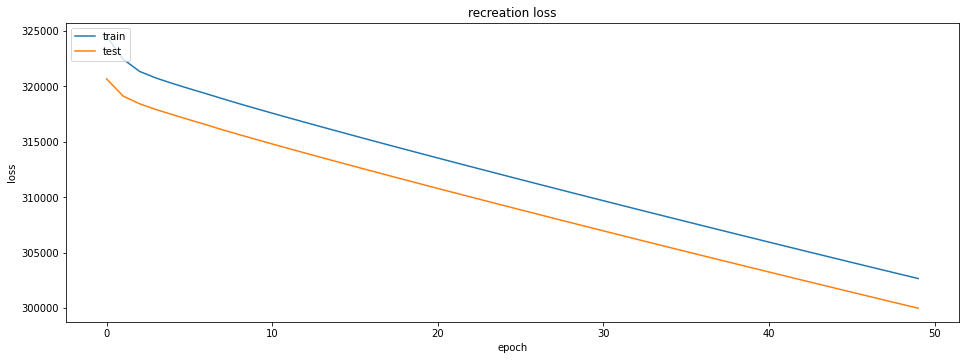

Intlier max value: 357284.22 Index Val: 265
outlier max value: 343376.5 Index Val: 37
outlier min value: 276880.6 Index Val: 5


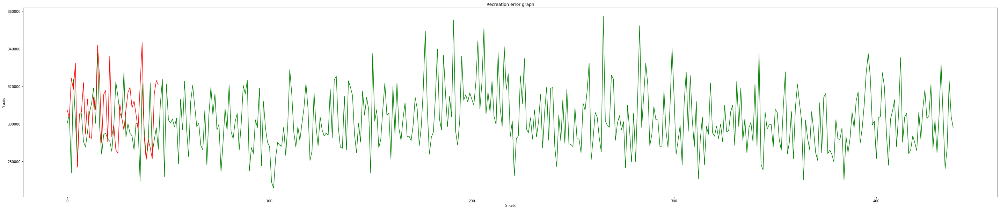

Total member in inlear: 439
Total False alarm: 416
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       0.96      0.05      0.10       439
           1       0.10      0.98      0.18        46

    accuracy                           0.14       485
   macro avg       0.53      0.52      0.14       485
weighted avg       0.88      0.14      0.11       485



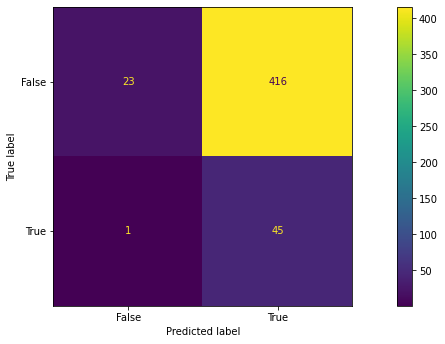

trecall_max: 0.05239179954441914 frecall_max: 0.9782608695652174 Count: 1
Epoch 1/50
11/11 [==============================] - 12s 283ms/step - loss: 324293.2812 - val_loss: 320489.8125
Epoch 2/50
11/11 [==============================] - 1s 96ms/step - loss: 322340.6250 - val_loss: 319067.1250
Epoch 3/50
11/11 [==============================] - 1s 97ms/step - loss: 321265.4688 - val_loss: 318328.4688
Epoch 4/50
11/11 [==============================] - 1s 100ms/step - loss: 320646.9375 - val_loss: 317802.6875
Epoch 5/50
11/11 [==============================] - 1s 99ms/step - loss: 320144.8125 - val_loss: 317322.9688
Epoch 6/50
11/11 [==============================] - 1s 98ms/step - loss: 319659.5938 - val_loss: 316838.9062
Epoch 7/50
11/11 [==============================] - 1s 94ms/step - loss: 319187.5312 - val_loss: 316382.8125
Epoch 8/50
11/11 [==============================] - 1s 94ms/step - loss: 318735.1250 - val_loss: 315938.3750
Epoch 9/50
11/11 [==============================] -

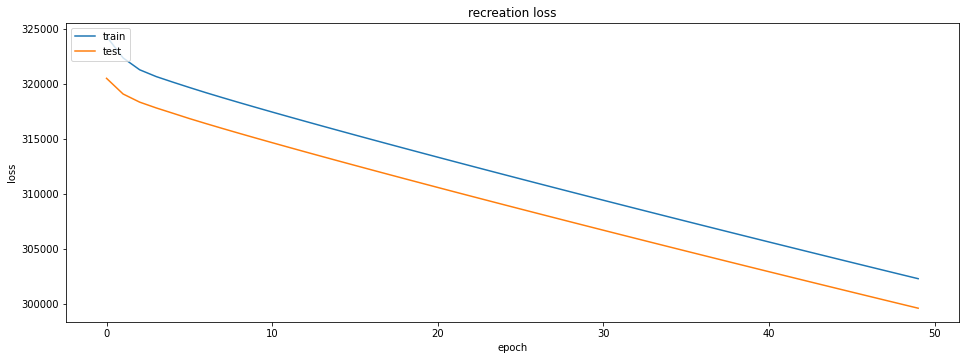

Intlier max value: 356872.8 Index Val: 265
outlier max value: 342954.3 Index Val: 37
outlier min value: 276506.56 Index Val: 5


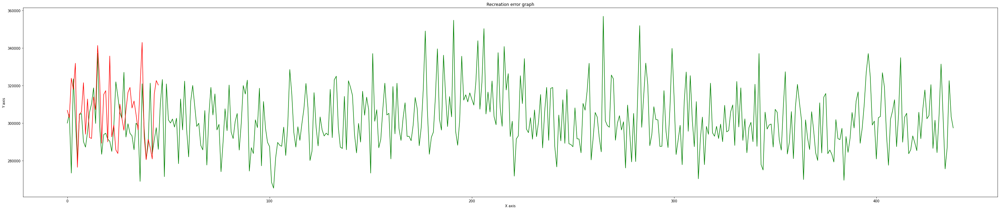

Total member in inlear: 439
Total False alarm: 416
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       0.96      0.05      0.10       439
           1       0.10      0.98      0.18        46

    accuracy                           0.14       485
   macro avg       0.53      0.52      0.14       485
weighted avg       0.88      0.14      0.11       485



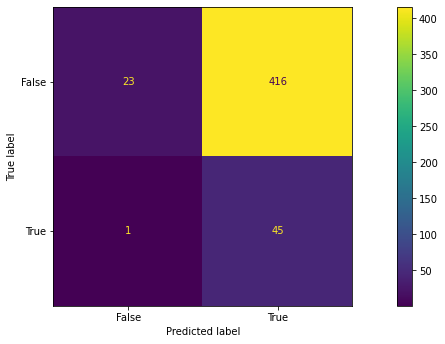

trecall_max: 0.05239179954441914 frecall_max: 0.9782608695652174 Count: 2


In [ ]:
# Hyper Parameter input:
b1 = 20 # window size
n = 8 # No. of features
e = 50
# Load Raw Data for LSTM
T,mf = rawDataload_TWF_win()
# Create test and training sets
XT,YT,XTs,YTs = TrainTestData(b1,T,mf)
# amplify the diffrences 
amp = 1
trn = np.power(XT, amp)
tst = np.power(XTs, amp)

# nomalize by dividing max value of train matrix
max_value = np.max(trn,axis = 0)
print(max_value)
trainN = (trn/max_value)*max_value
testN = (tst/max_value)*max_value
# Convert data into windows
Tr_w = TS_window(b1,n,trainN) # Numpy windows output of Inliear data
Ts_w = TS_window(b1,n,testN) # Numpy windows output of Outlier data

#m1 = m1_lstm_ae(Tr_w,e)
# Input for  looping:
trecall_max = 0.0
frecall_max = 0.0
count = 0
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
m1_path = '/content/gdrive/MyDrive/outlier_models/lstm_m1'
#m1,history,k = m1_lstm_ae(Tr_w,e)
while count < 5:
  m1,history,k = m1_lstm_ae(Tr_w,e)
  MODEL1 = m1
  #X_test_2 = testN.reshape(len(testN),1,8,1)
  # Output analysis
  ## Plot the model training and validation 
  print("Loss",list(history.history['loss'])[-1],"Validation Loss:",list(history.history['val_loss'])[-1])
  plt_model_accuracy(history)
  inlier_lst,outlier_lst = model_analysis(Tr_w,Ts_w,MODEL1)
  #outlier cut-off point:
  oc = min(outlier_lst)
  oc = oc+oc*(1/100)
  mat1 = confusionMatrix(oc,inlier_lst,outlier_lst)
  trecall = mat1['0']['recall']
  frecall = mat1['1']['recall']
  #count+=1
  if trecall_max <= trecall and frecall_max <= frecall:
    trecall_max = trecall
    frecall_max = frecall
    count+=1
    print("trecall_max:",trecall_max,'frecall_max:',frecall_max, 'Count:',count)
    #m1.save(m1_path)
    if count == 2:
      break

In [ ]:
max_value = np.max(trn,axis = 0)
max_value1 =trn / np.max(trn,axis = 0)

In [ ]:
trainN

array([[0.979, 0.983, 0.576, ..., 0.   , 0.   , 1.   ],
       [0.979, 0.984, 0.522, ..., 0.   , 1.   , 0.   ],
       [0.979, 0.983, 0.556, ..., 0.   , 1.   , 0.   ],
       ...,
       [0.982, 0.983, 0.61 , ..., 0.   , 0.   , 1.   ],
       [0.982, 0.984, 0.522, ..., 1.   , 0.   , 0.   ],
       [0.982, 0.984, 0.557, ..., 0.   , 0.   , 1.   ]])

In [ ]:
max_value1 = np.max(tst,axis=0)
max_value1

array([ 304.4,  313.7, 2514. ,   65.3,  253. ,    1. ,    1. ,    1. ])

In [ ]:
Ts_w[0]

array([[ 298.8,  309.1, 1513. ,   40.3,  160. ,    0. ,    1. ,    0. ],
       [ 298.8,  309. , 1661. ,   29.5,  162. ,    0. ,    0. ,    1. ],
       [ 298.8,  309.1, 1378. ,   54.4,  165. ,    0. ,    1. ,    0. ],
       [ 298.8,  309.1, 1393. ,   52.6,  167. ,    0. ,    1. ,    0. ],
       [ 298.8,  309. , 1592. ,   38.2,  169. ,    0. ,    0. ,    1. ],
       [ 298.8,  309. , 1829. ,   22.9,  172. ,    0. ,    1. ,    0. ],
       [ 298.9,  309. , 1812. ,   25.9,  174. ,    0. ,    0. ,    1. ],
       [ 299. ,  309.1, 1523. ,   38.6,  177. ,    0. ,    1. ,    0. ],
       [ 299. ,  309.1, 1394. ,   45.1,  179. ,    0. ,    1. ,    0. ],
       [ 298.9,  308.9, 1679. ,   28.7,  181. ,    0. ,    0. ,    1. ],
       [ 298.8,  308.9, 1466. ,   44.1,  184. ,    1. ,    0. ,    0. ],
       [ 298.8,  308.9, 1527. ,   32.4,  189. ,    0. ,    1. ,    0. ],
       [ 298.9,  309. , 1924. ,   22.6,  193. ,    0. ,    0. ,    1. ],
       [ 298.9,  309.1, 1452. ,   45.5,  196. ,    

In [ ]:
Tr_w[0]

array([[ 298.1,  308.6, 1551. ,   42.8,    0. ,    0. ,    0. ,    1. ],
       [ 298.2,  308.7, 1408. ,   46.3,    3. ,    0. ,    1. ,    0. ],
       [ 298.1,  308.5, 1498. ,   49.4,    5. ,    0. ,    1. ,    0. ],
       [ 298.2,  308.6, 1433. ,   39.5,    7. ,    0. ,    1. ,    0. ],
       [ 298.2,  308.7, 1408. ,   40. ,    9. ,    0. ,    1. ,    0. ],
       [ 298.1,  308.6, 1425. ,   41.9,   11. ,    0. ,    0. ,    1. ],
       [ 298.1,  308.6, 1558. ,   42.4,   14. ,    0. ,    1. ,    0. ],
       [ 298.1,  308.6, 1527. ,   40.2,   16. ,    0. ,    1. ,    0. ],
       [ 298.3,  308.7, 1667. ,   28.6,   18. ,    0. ,    0. ,    1. ],
       [ 298.5,  309. , 1741. ,   28. ,   21. ,    0. ,    0. ,    1. ],
       [ 298.4,  308.9, 1782. ,   23.9,   24. ,    1. ,    0. ,    0. ],
       [ 298.6,  309.1, 1423. ,   44.3,   29. ,    1. ,    0. ,    0. ],
       [ 298.6,  309.1, 1339. ,   51.1,   34. ,    0. ,    0. ,    1. ],
       [ 298.6,  309.2, 1742. ,   30. ,   37. ,    

In [ ]:
XTs*3

array([[ 896.4,  927.3, 4539. , ...,    0. ,    3. ,    0. ],
       [ 896.4,  927. , 4983. , ...,    0. ,    0. ,    3. ],
       [ 896.4,  927.3, 4134. , ...,    0. ,    3. ,    0. ],
       ...,
       [ 895.8,  929.4, 4791. , ...,    0. ,    3. ,    0. ],
       [ 895.8,  929.7, 4551. , ...,    0. ,    0. ,    3. ],
       [ 895.8,  929.4, 6813. , ...,    0. ,    3. ,    0. ]])

In [ ]:
T

,airTemp,processTemp,rotationalSpeed,torque,toolwear,TWF,Type_is_H,Type_is_L,Type_is_M
0,298.1,308.6,1551,42.8,0,0,0,0,1
1,298.2,308.7,1408,46.3,3,0,0,1,0
2,298.1,308.5,1498,49.4,5,0,0,1,0
3,298.2,308.6,1433,39.5,7,0,0,1,0
4,298.2,308.7,1408,40.0,9,0,0,1,0
...,...,...,...,...,...,...,...,...,...
9702,298.8,308.4,1604,29.5,14,0,0,0,1
9703,298.9,308.4,1632,31.8,17,0,1,0,0
9704,299.0,308.6,1645,33.4,22,0,0,0,1
9705,299.0,308.7,1408,48.5,25,0,1,0,0


## Tool Wear failure(TWF) machine failure analysis for individual features usning CNN-AE

19573852375.0
Mounted at /content/gdrive
Intlier max value: 27713640000000.0 Index Val: 9337
outlier max value: 32797150000000.0 Index Val: 23
outlier min value: 7534243500000.0 Index Val: 5


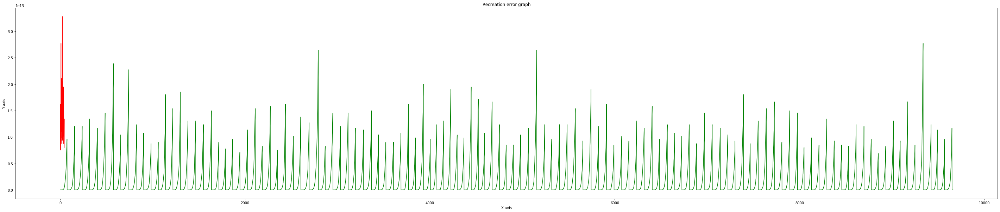

Total member in inlear: 9661
Total False alarm: 724
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.93      0.96      9661
           1       0.06      0.98      0.11        46

    accuracy                           0.93      9707
   macro avg       0.53      0.95      0.54      9707
weighted avg       1.00      0.93      0.96      9707



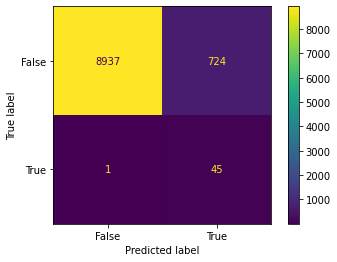

In [ ]:
import tensorflow as tf
from tensorflow import keras
from keras import layers
from tensorflow.keras import regularizers
from google.colab import drive
import numpy as np
e = 1000
# Load the training and test data
train_inlear_all, test_outlier_all,rd = rawDataload_TWF()
train_inlear = train_inlear_all
test_outlier = test_outlier_all
# amplify the diffrences 
trn = np.power(train_inlear.values, 3)
tst = np.power(test_outlier.values, 3)

# nomalize by dividing max value of train matrix
max_value = np.max(trn)
print(max_value)
trainN = (trn/max_value)*max_value
testN = (tst/max_value)*max_value

# Prepare input for model
train_2 = trainN.reshape(len(trainN),1,8,1)
test_2 = testN.reshape(len(testN),1,8,1)
# Load the saved model
drive.mount('/content/gdrive', force_remount=True)
m1_path = '/content/gdrive/MyDrive/outlier_models/m2' 
m2 = tf.keras.models.load_model(m1_path)
MODEL1 = m2
X_test_2 = testN.reshape(len(testN),1,8,1)
# Output analysis
## Plot the model training and validation 
#print("Loss",list(history.history['loss'])[-1],"Validation Loss:",list(history.history['val_loss'])[-1])
#plt_model_accuracy(history)
inlier_lst,outlier_lst = model_analysis(train_2,X_test_2,MODEL1)
#outlier cut-off point:
oc = min(outlier_lst)
oc = oc+oc*(1/100)
mat1 = confusionMatrix(oc,inlier_lst,outlier_lst)

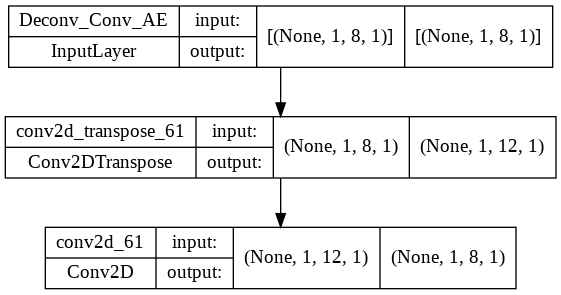

In [ ]:
keras.utils.plot_model(m2, "2dcnn-ae_1.png", show_shapes=True)

In [ ]:
m2.summary()

Model: "model_55"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Deconv_Conv_AE (InputLayer)  [(None, 1, 8, 1)]        0         
                                                                 
 conv2d_transpose_61 (Conv2D  (None, 1, 12, 1)         6         
 Transpose)                                                      
                                                                 
 conv2d_61 (Conv2D)          (None, 1, 8, 1)           6         
                                                                 
Total params: 12
Trainable params: 12
Non-trainable params: 0
_________________________________________________________________


In [ ]:
train_inlear_all.head()

,airTemp,processTemp,rotationalSpeed,torque,toolwear,Type_is_H,Type_is_L,Type_is_M
0,298.1,308.6,1551,42.8,0,0,0,1
1,298.2,308.7,1408,46.3,3,0,1,0
2,298.1,308.5,1498,49.4,5,0,1,0
3,298.2,308.6,1433,39.5,7,0,1,0
4,298.2,308.7,1408,40.0,9,0,1,0


In [ ]:
test_outlier_all.head()

,airTemp,processTemp,rotationalSpeed,torque,toolwear,Type_is_H,Type_is_L,Type_is_M
77,298.8,308.9,1455,41.3,208,0,1,0
1087,296.9,307.8,1549,35.8,206,1,0,0
1509,298.0,308.5,1429,37.7,220,0,1,0
1682,297.9,307.4,1604,36.1,225,1,0,0
1763,298.2,307.6,1511,31.0,209,0,1,0


## Individual Features recreation error generated by model

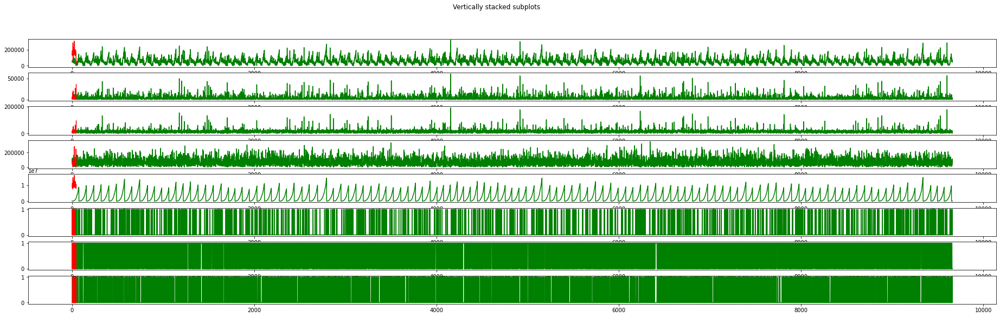

In [ ]:
y_true_train = train_2
y_pred_train = m2.predict(train_2)
abs_val_train = np.absolute(y_true_train - y_pred_train)
y_true_test = test_2
y_pred_test = m2.predict(test_2)
abs_val_test = np.absolute(y_true_test - y_pred_test)
abs_new_train = abs_val_train.reshape(len(abs_val_train),8)
abs_new_test = abs_val_test.reshape(len(abs_val_test),8)
import matplotlib.pyplot as plt
fig, axs = plt.subplots(8,figsize=(32,9))
fig.suptitle('Vertically stacked subplots')
for i in range((abs_new_train.shape[1])):
  ytrain = abs_new_train[:,i]
  ytest =  abs_new_test[:,i]
  axs[i].plot(ytrain,color ="green")
  axs[i].plot(ytest,color ="red")
  #print(abs_new[0:30][:,i])
 
  #plt.plot(y, color ="green")
plt.show()

**In the above graph it is clear that 5th feature(Tool Wears) represent the best to identify the outlier. If we use only this then this will further reduce the false alarm.**

## CNN-AE OverComplete AE

[2.823e+07 3.090e+07 1.957e+10 3.430e+05 1.489e+07 1.000e+00 1.000e+00
 1.000e+00]
Mounted at /content/gdrive
Loss 6.889629133866038e-08 Validation Loss: 2.986092439982713e-08
dict_keys(['loss', 'val_loss'])


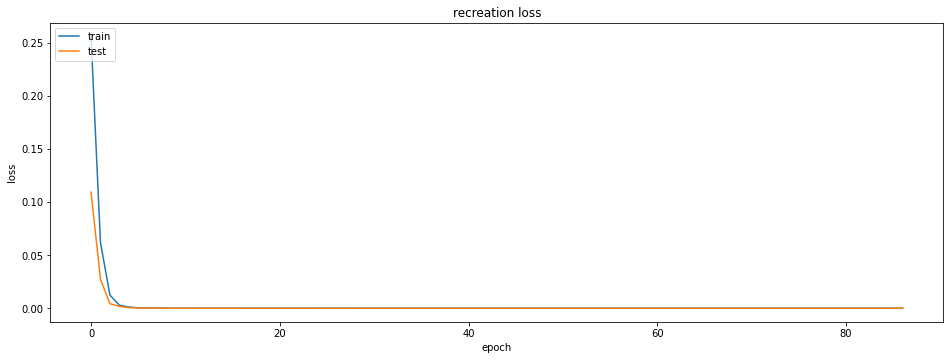

Intlier max value: 1.4834623e-07 Index Val: 2789
outlier max value: 1.6821039e-07 Index Val: 9
outlier min value: 3.165435e-08 Index Val: 10


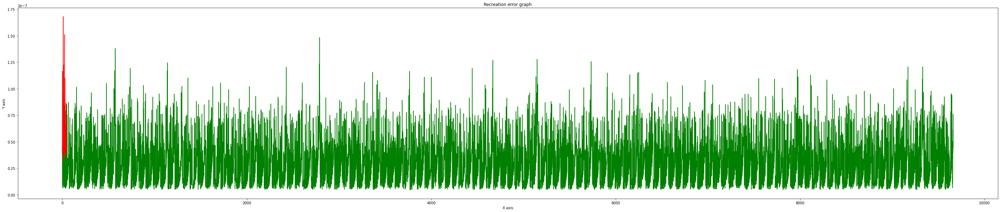

Total member in inlear: 9661
Total False alarm: 4122
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.57      0.73      9661
           1       0.01      0.98      0.02        46

    accuracy                           0.58      9707
   macro avg       0.51      0.78      0.38      9707
weighted avg       1.00      0.58      0.73      9707



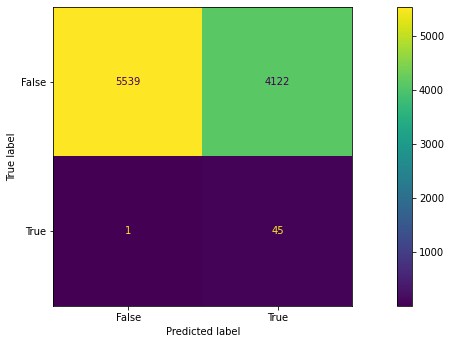

trecall_max: 0.573336093572094 frecall_max: 0.9782608695652174 Count: 1


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m2/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m2/assets


Loss 4.334492587076966e-08 Validation Loss: 4.447625556736057e-08
dict_keys(['loss', 'val_loss'])


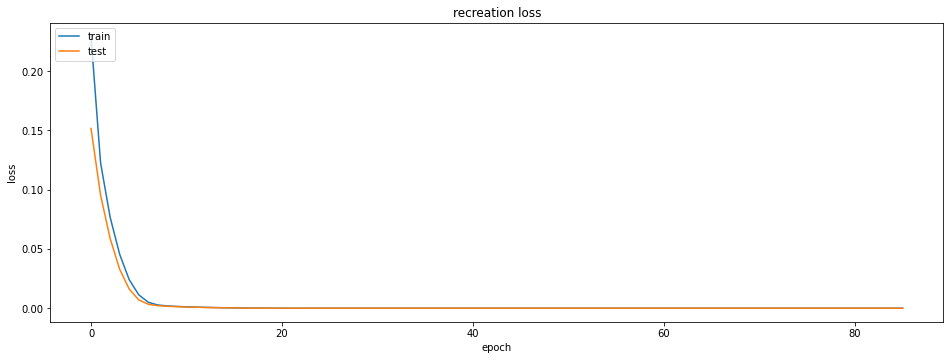

Intlier max value: 1.2222478e-07 Index Val: 6250
outlier max value: 1.2123351e-07 Index Val: 24
outlier min value: 2.5039984e-08 Index Val: 12


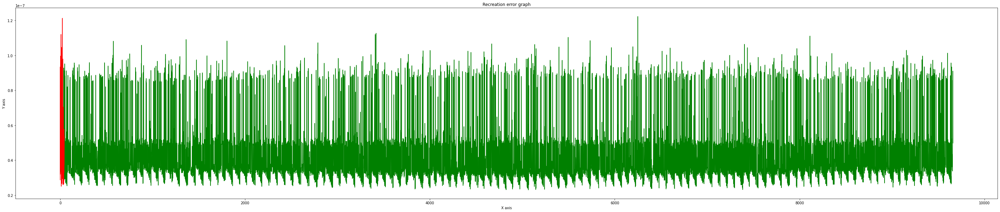

Total member in inlear: 9661
Total False alarm: 9522
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       0.99      0.01      0.03      9661
           1       0.00      0.98      0.01        46

    accuracy                           0.02      9707
   macro avg       0.50      0.50      0.02      9707
weighted avg       0.99      0.02      0.03      9707



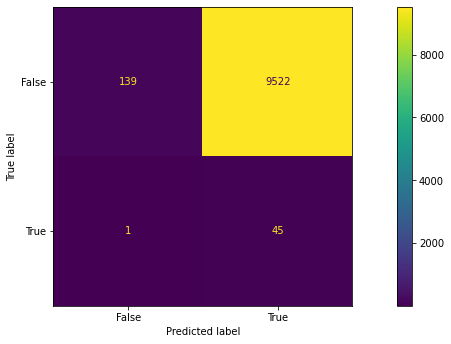

Loss 7.413599689698458e-08 Validation Loss: 8.433752896053193e-08
dict_keys(['loss', 'val_loss'])


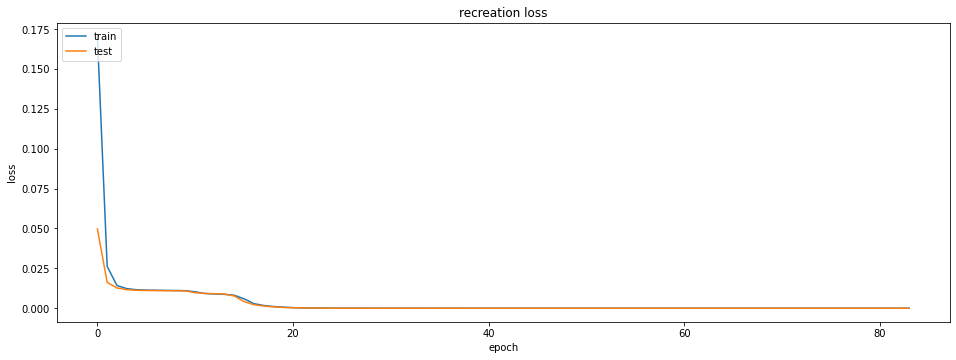

Intlier max value: 2.743527e-07 Index Val: 2789
outlier max value: 2.902625e-07 Index Val: 9
outlier min value: 6.9959434e-08 Index Val: 40


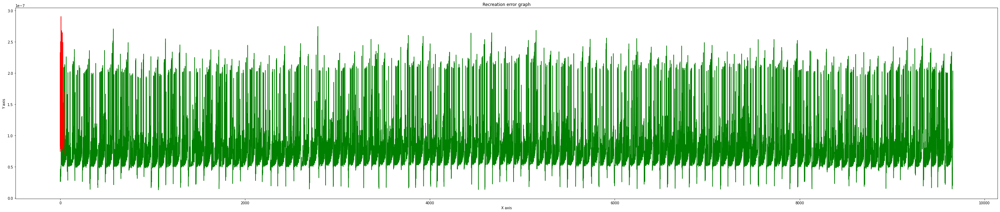

Total member in inlear: 9661
Total False alarm: 4420
Total member in Outlier: 46
Total missed true alarm: 2
              precision    recall  f1-score   support

           0       1.00      0.54      0.70      9661
           1       0.01      0.96      0.02        46

    accuracy                           0.54      9707
   macro avg       0.50      0.75      0.36      9707
weighted avg       0.99      0.54      0.70      9707



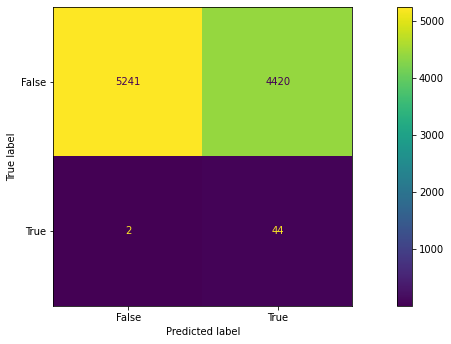

Loss 6.063164539191136e-16 Validation Loss: 6.418265102877373e-16
dict_keys(['loss', 'val_loss'])


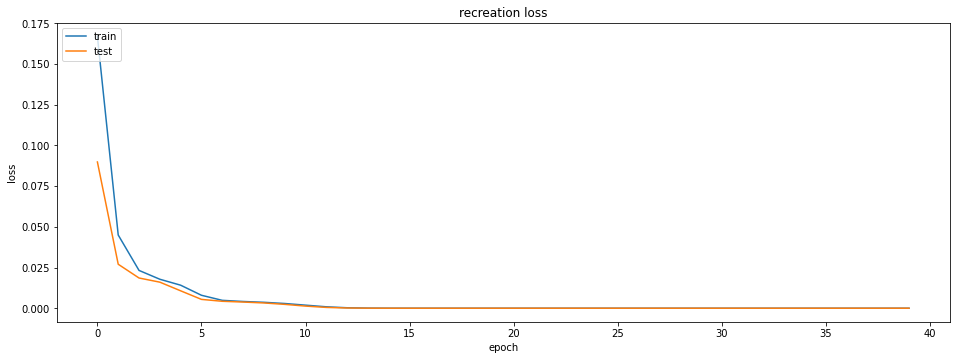

Intlier max value: 1.8151188e-15 Index Val: 6250
outlier max value: 1.4432899e-15 Index Val: 12
outlier min value: 0.0 Index Val: 8


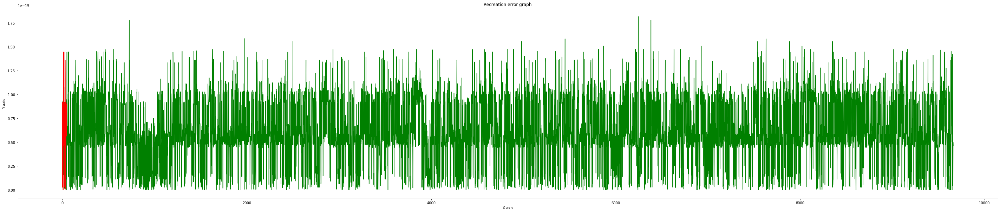

Total member in inlear: 9661
Total False alarm: 9602
Total member in Outlier: 46
Total missed true alarm: 0
              precision    recall  f1-score   support

           0       1.00      0.01      0.01      9661
           1       0.00      1.00      0.01        46

    accuracy                           0.01      9707
   macro avg       0.50      0.50      0.01      9707
weighted avg       1.00      0.01      0.01      9707



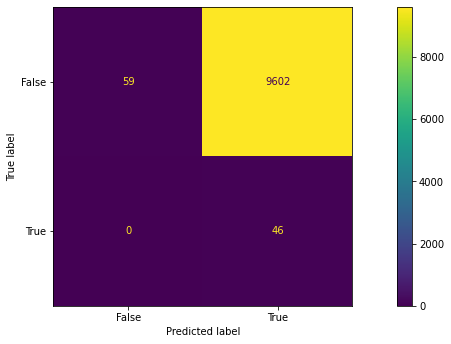

Loss 2.2503836305531877e-07 Validation Loss: 2.1891803214657557e-07
dict_keys(['loss', 'val_loss'])


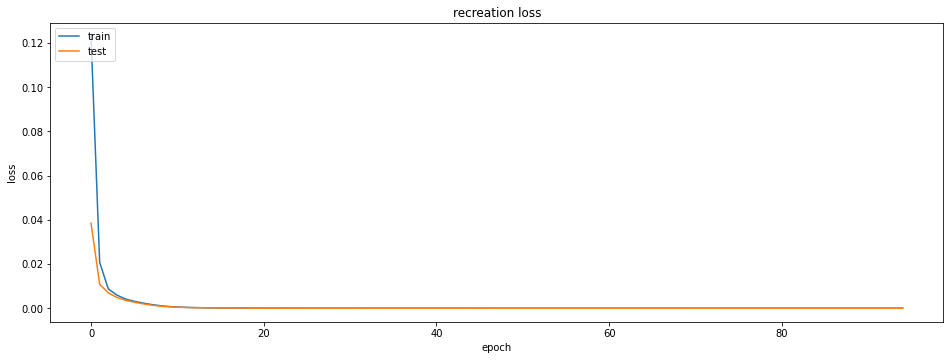

Intlier max value: 1.0329844e-06 Index Val: 6234
outlier max value: 8.179699e-07 Index Val: 24
outlier min value: 6.0350004e-08 Index Val: 38


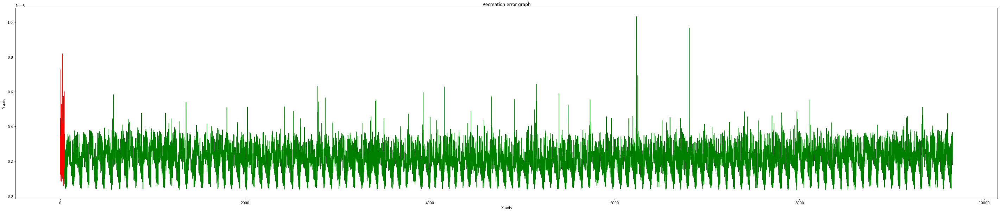

Total member in inlear: 9661
Total False alarm: 9243
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.04      0.08      9661
           1       0.00      0.98      0.01        46

    accuracy                           0.05      9707
   macro avg       0.50      0.51      0.05      9707
weighted avg       0.99      0.05      0.08      9707



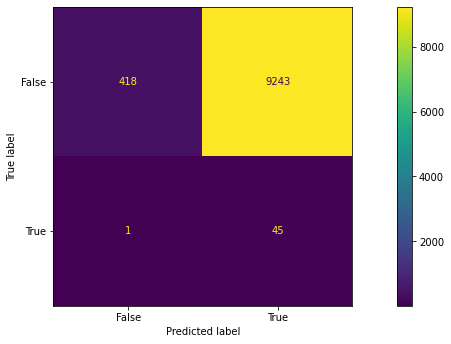

Loss 3.0649548676819904e-08 Validation Loss: 1.189883036545325e-08
dict_keys(['loss', 'val_loss'])


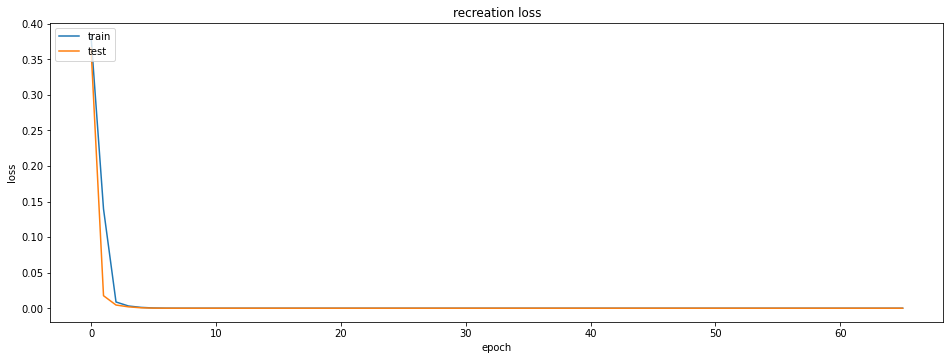

Intlier max value: 8.0514766e-08 Index Val: 2789
outlier max value: 1.3242794e-07 Index Val: 23
outlier min value: 1.3639665e-08 Index Val: 10


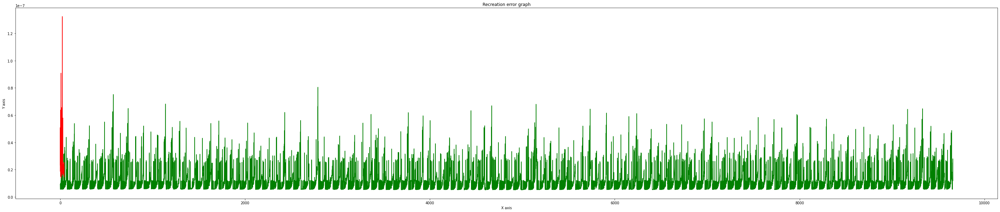

Total member in inlear: 9661
Total False alarm: 1961
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.80      0.89      9661
           1       0.02      0.98      0.04        46

    accuracy                           0.80      9707
   macro avg       0.51      0.89      0.47      9707
weighted avg       1.00      0.80      0.88      9707



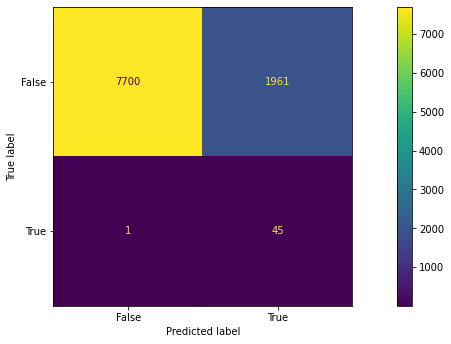

trecall_max: 0.797018942138495 frecall_max: 0.9782608695652174 Count: 2


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m2/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m2/assets


Loss 2.1739073062710832e-15 Validation Loss: 1.3064677471306507e-15
dict_keys(['loss', 'val_loss'])


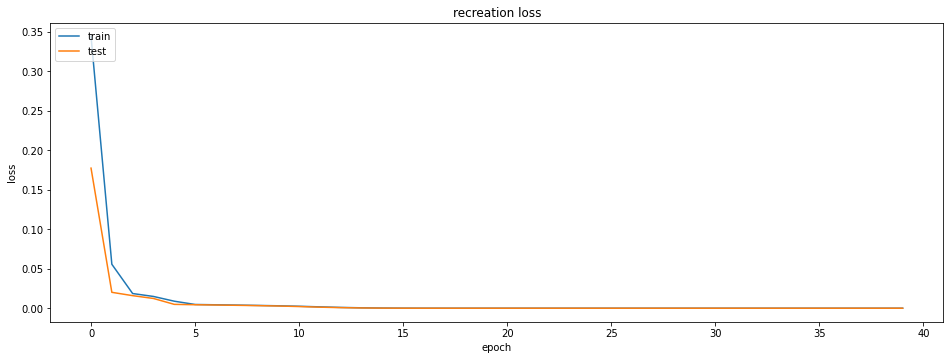

Intlier max value: 6.803285e-15 Index Val: 574
outlier max value: 6.6890937e-15 Index Val: 24
outlier min value: 9.15934e-16 Index Val: 26


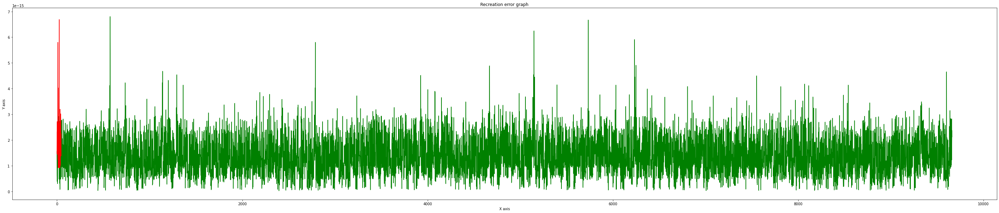

Total member in inlear: 9661
Total False alarm: 6308
Total member in Outlier: 46
Total missed true alarm: 5
              precision    recall  f1-score   support

           0       1.00      0.35      0.52      9661
           1       0.01      0.89      0.01        46

    accuracy                           0.35      9707
   macro avg       0.50      0.62      0.26      9707
weighted avg       0.99      0.35      0.51      9707



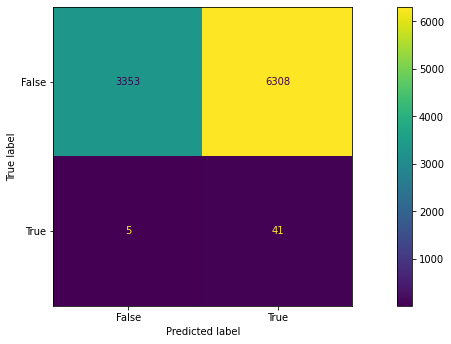

Loss 7.970172373646112e-13 Validation Loss: 4.31503747663764e-12
dict_keys(['loss', 'val_loss'])


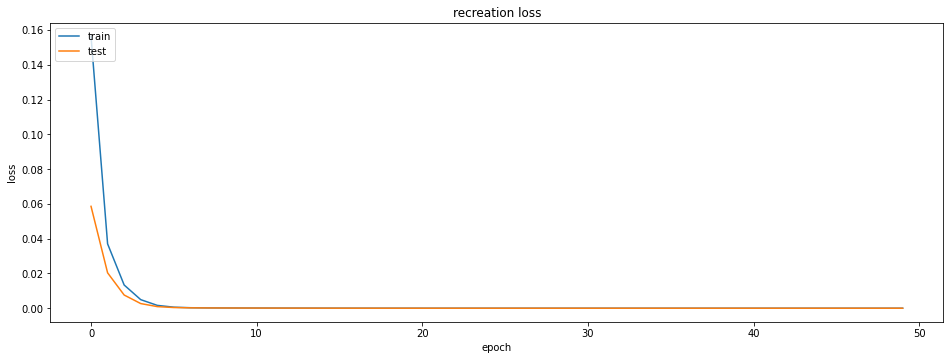

Intlier max value: 1.1642262e-11 Index Val: 2789
outlier max value: 1.363256e-11 Index Val: 24
outlier min value: 4.97085e-12 Index Val: 5


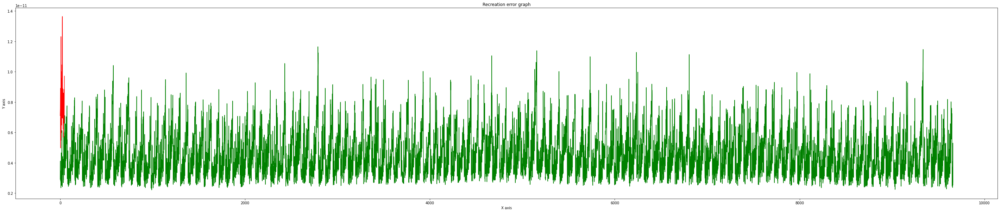

Total member in inlear: 9661
Total False alarm: 2860
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.70      0.83      9661
           1       0.02      0.98      0.03        46

    accuracy                           0.71      9707
   macro avg       0.51      0.84      0.43      9707
weighted avg       1.00      0.71      0.82      9707



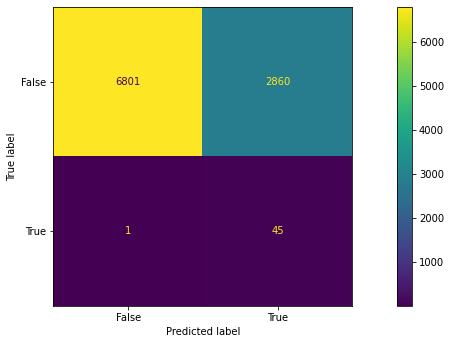

Loss 5.444349682193206e-08 Validation Loss: 3.521869018641155e-08
dict_keys(['loss', 'val_loss'])


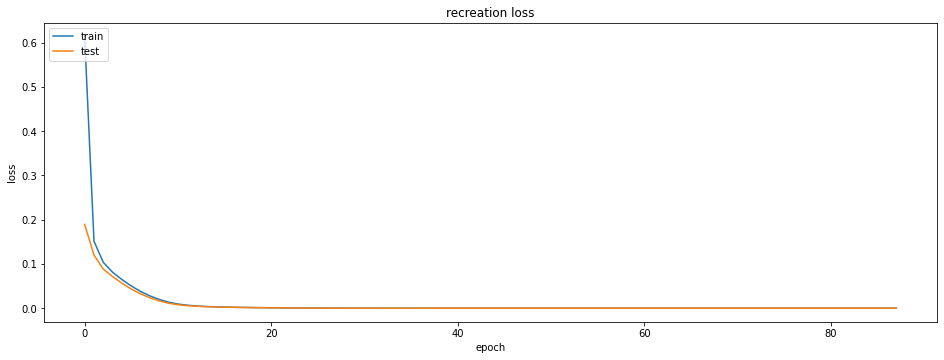

Intlier max value: 1.4157293e-07 Index Val: 575
outlier max value: 1.489438e-07 Index Val: 9
outlier min value: 2.666703e-08 Index Val: 43


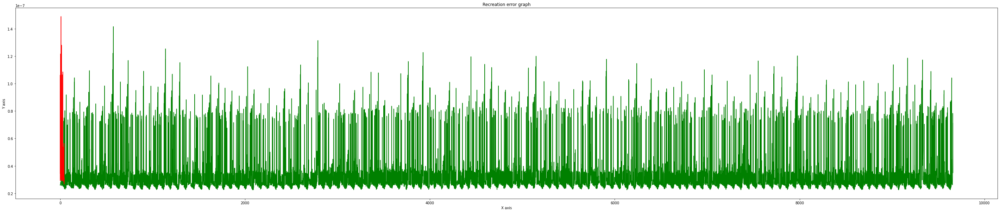

Total member in inlear: 9661
Total False alarm: 5770
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.40      0.57      9661
           1       0.01      0.98      0.02        46

    accuracy                           0.41      9707
   macro avg       0.50      0.69      0.29      9707
weighted avg       1.00      0.41      0.57      9707



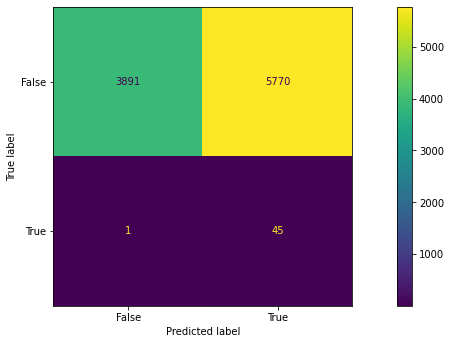

Loss 8.804313011978593e-08 Validation Loss: 2.9457143391198315e-09
dict_keys(['loss', 'val_loss'])


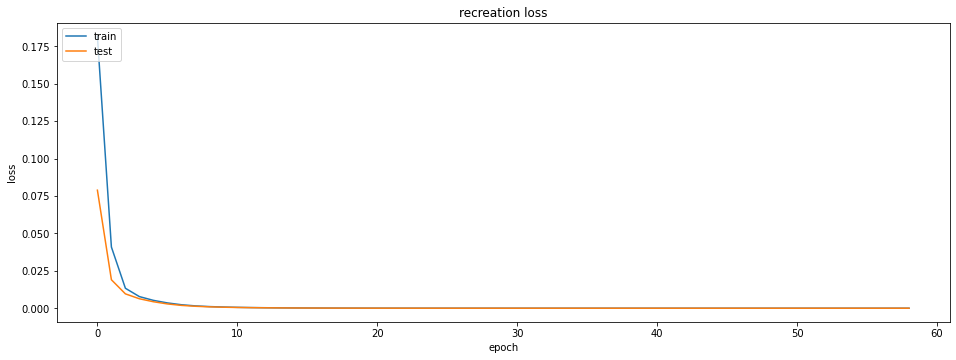

Intlier max value: 1.730028e-08 Index Val: 6250
outlier max value: 2.067782e-08 Index Val: 24
outlier min value: 3.2486935e-09 Index Val: 38


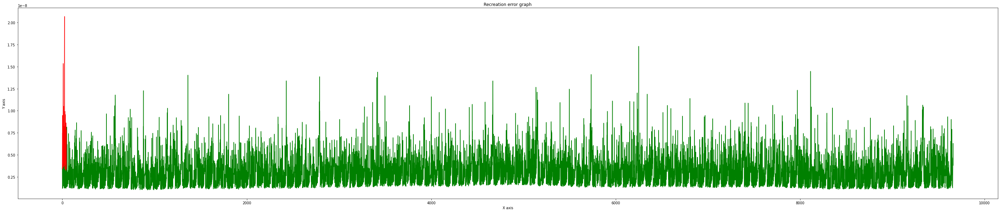

Total member in inlear: 9661
Total False alarm: 4004
Total member in Outlier: 46
Total missed true alarm: 2
              precision    recall  f1-score   support

           0       1.00      0.59      0.74      9661
           1       0.01      0.96      0.02        46

    accuracy                           0.59      9707
   macro avg       0.51      0.77      0.38      9707
weighted avg       0.99      0.59      0.74      9707



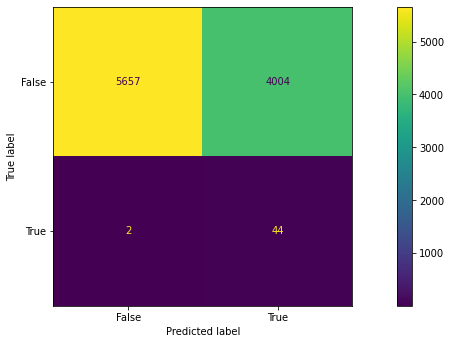

Loss 8.60526796486738e-08 Validation Loss: 5.342741360436776e-08
dict_keys(['loss', 'val_loss'])


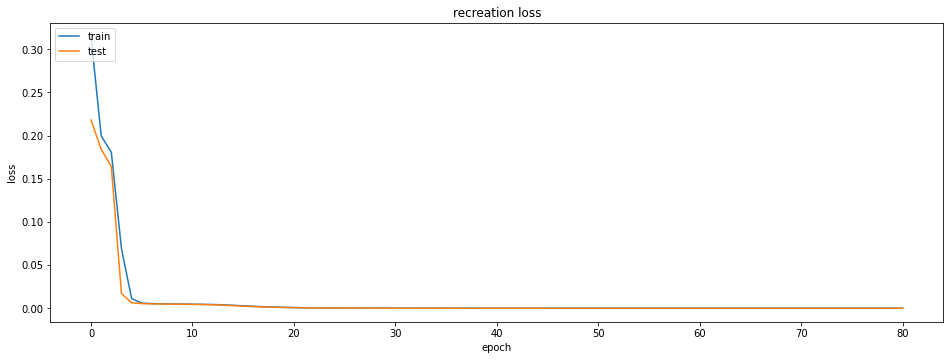

Intlier max value: 8.031388e-06 Index Val: 4155
outlier max value: 4.2750057e-07 Index Val: 24
outlier min value: 2.304099e-08 Index Val: 40


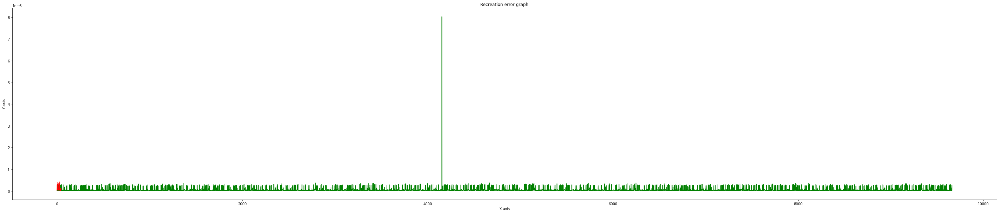

Total member in inlear: 9661
Total False alarm: 5630
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.42      0.59      9661
           1       0.01      0.98      0.02        46

    accuracy                           0.42      9707
   macro avg       0.50      0.70      0.30      9707
weighted avg       1.00      0.42      0.59      9707



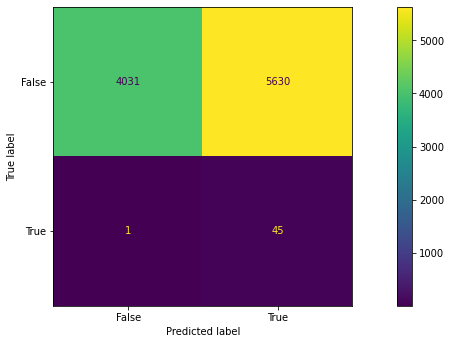

Loss 0.378901869058609 Validation Loss: 0.3709942698478699
dict_keys(['loss', 'val_loss'])


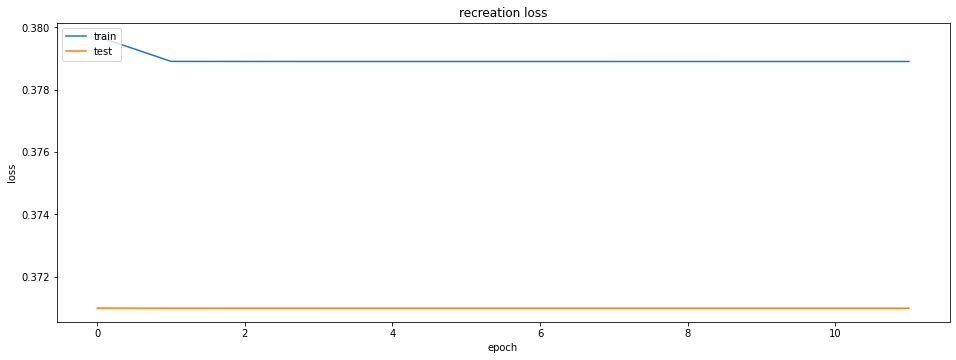

Intlier max value: 0.50356185 Index Val: 5156
outlier max value: 0.5466257 Index Val: 23
outlier min value: 0.38738725 Index Val: 5


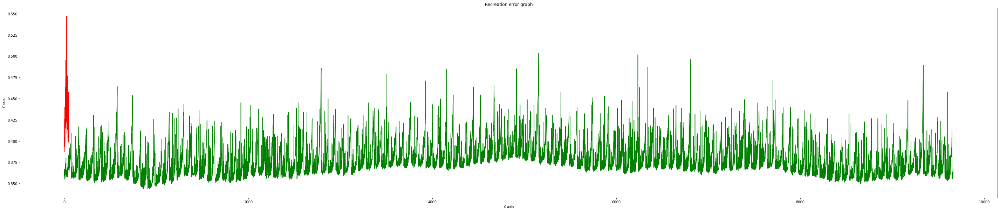

Total member in inlear: 9661
Total False alarm: 1853
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.81      0.89      9661
           1       0.02      0.98      0.05        46

    accuracy                           0.81      9707
   macro avg       0.51      0.89      0.47      9707
weighted avg       1.00      0.81      0.89      9707



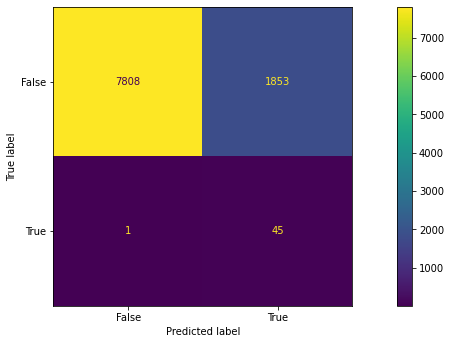

trecall_max: 0.8081979091191388 frecall_max: 0.9782608695652174 Count: 3


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m2/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m2/assets


Loss 0.3789019286632538 Validation Loss: 0.3709942698478699
dict_keys(['loss', 'val_loss'])


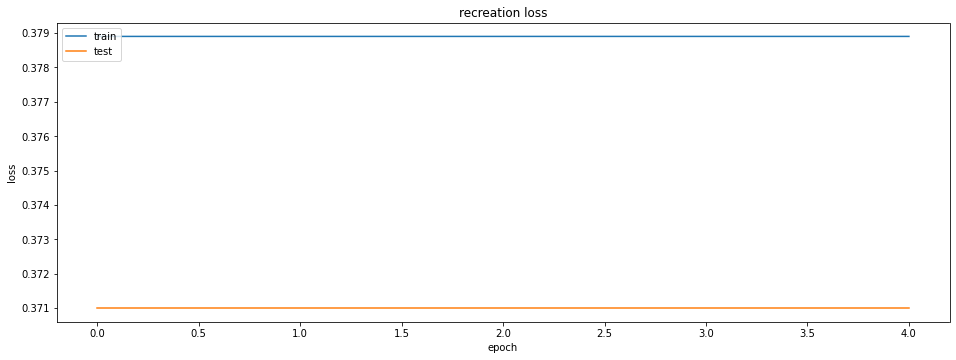

Intlier max value: 0.5035227 Index Val: 5156
outlier max value: 0.5466257 Index Val: 23
outlier min value: 0.38738725 Index Val: 5


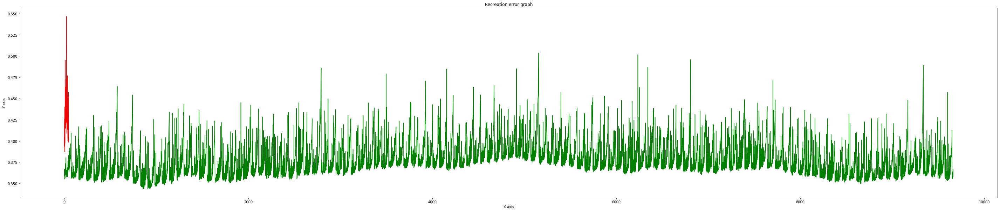

Total member in inlear: 9661
Total False alarm: 1853
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.81      0.89      9661
           1       0.02      0.98      0.05        46

    accuracy                           0.81      9707
   macro avg       0.51      0.89      0.47      9707
weighted avg       1.00      0.81      0.89      9707



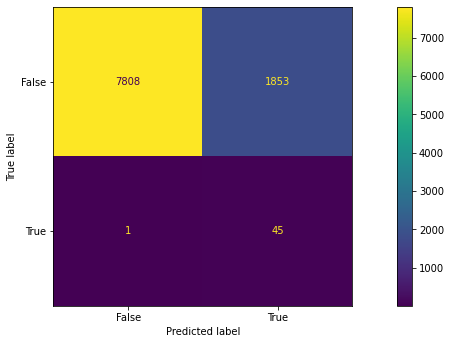

trecall_max: 0.8081979091191388 frecall_max: 0.9782608695652174 Count: 4


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m2/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m2/assets


Loss 2.633297526699607e-07 Validation Loss: 2.5813824322540313e-07
dict_keys(['loss', 'val_loss'])


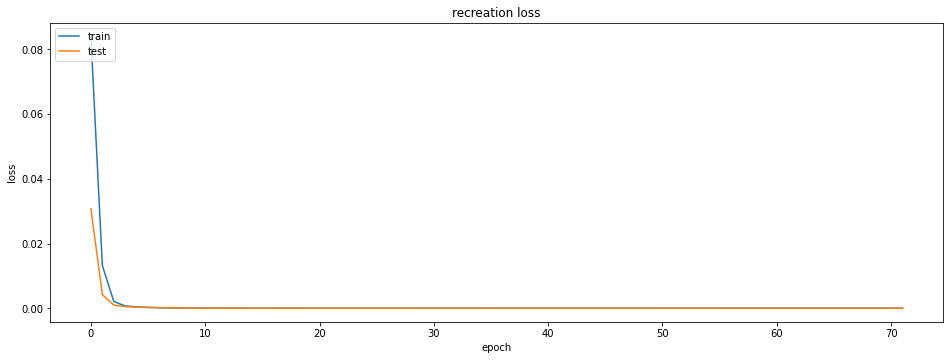

Intlier max value: 9.632216e-07 Index Val: 6234
outlier max value: 1.036072e-06 Index Val: 9
outlier min value: 6.37729e-08 Index Val: 38


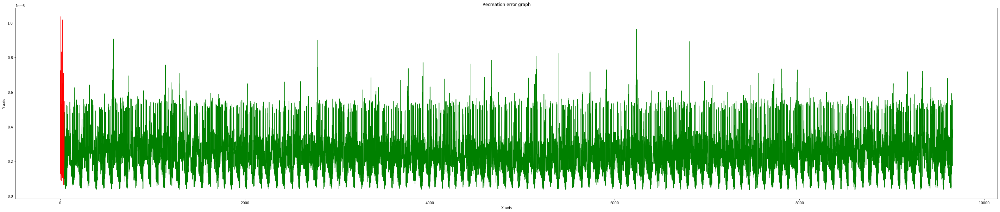

Total member in inlear: 9661
Total False alarm: 9210
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.05      0.09      9661
           1       0.00      0.98      0.01        46

    accuracy                           0.05      9707
   macro avg       0.50      0.51      0.05      9707
weighted avg       0.99      0.05      0.09      9707



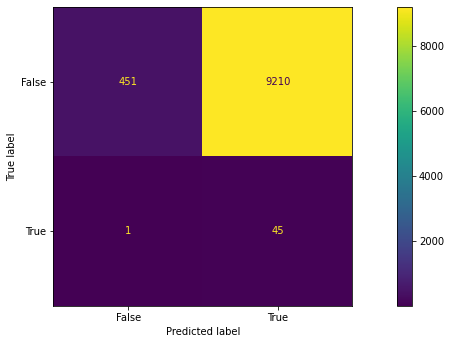

Loss 3.9242500804448355e-08 Validation Loss: 3.6273679171472395e-08
dict_keys(['loss', 'val_loss'])


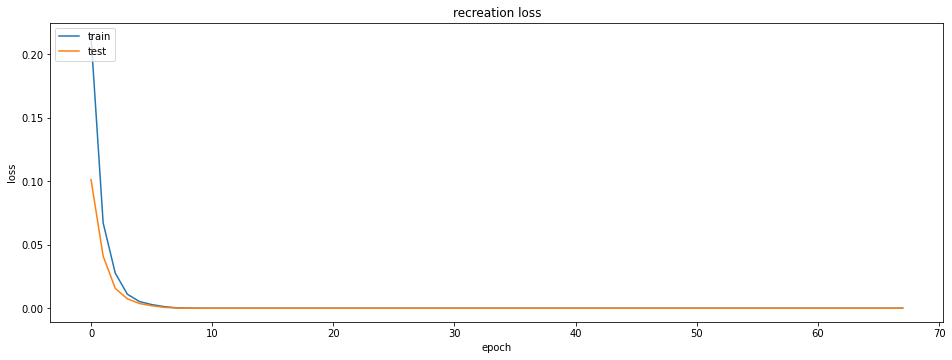

Intlier max value: 9.474286e-08 Index Val: 575
outlier max value: 8.9226216e-07 Index Val: 23
outlier min value: 4.138435e-08 Index Val: 10


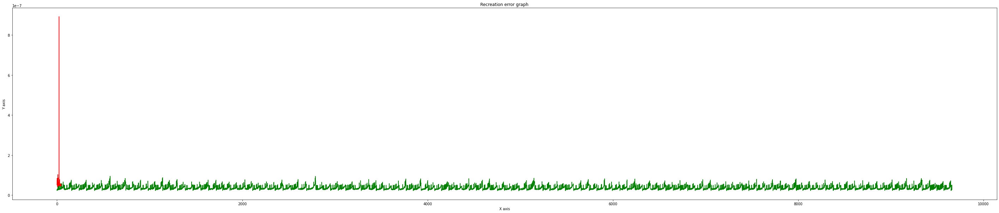

Total member in inlear: 9661
Total False alarm: 2094
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.78      0.88      9661
           1       0.02      0.98      0.04        46

    accuracy                           0.78      9707
   macro avg       0.51      0.88      0.46      9707
weighted avg       1.00      0.78      0.87      9707



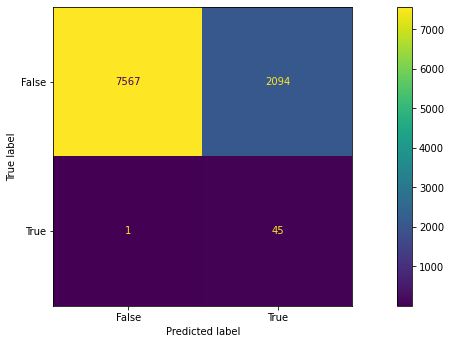

Loss 2.766366407052235e-15 Validation Loss: 9.276633899319765e-16
dict_keys(['loss', 'val_loss'])


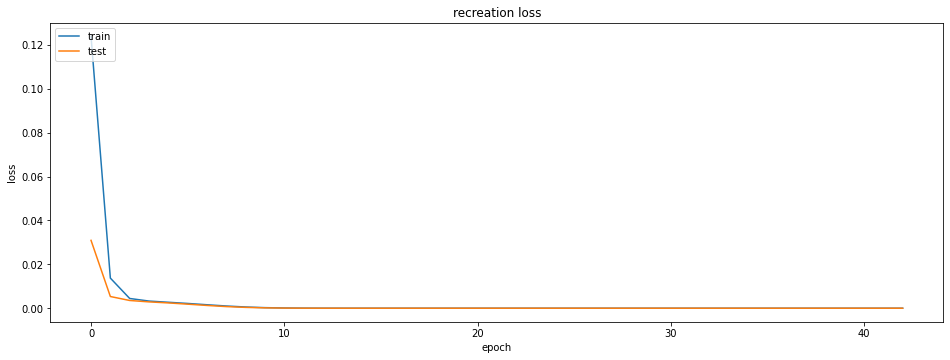

Intlier max value: 6.579806e-15 Index Val: 6599
outlier max value: 3.450365e-15 Index Val: 24
outlier min value: 2.7755576e-17 Index Val: 7


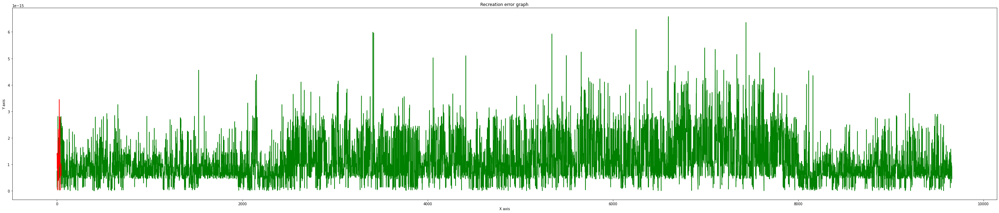

Total member in inlear: 9661
Total False alarm: 9586
Total member in Outlier: 46
Total missed true alarm: 2
              precision    recall  f1-score   support

           0       0.97      0.01      0.02      9661
           1       0.00      0.96      0.01        46

    accuracy                           0.01      9707
   macro avg       0.49      0.48      0.01      9707
weighted avg       0.97      0.01      0.02      9707



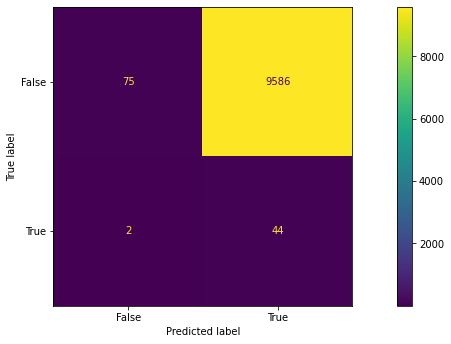

Loss 3.468586484700609e-08 Validation Loss: 5.325334484496125e-08
dict_keys(['loss', 'val_loss'])


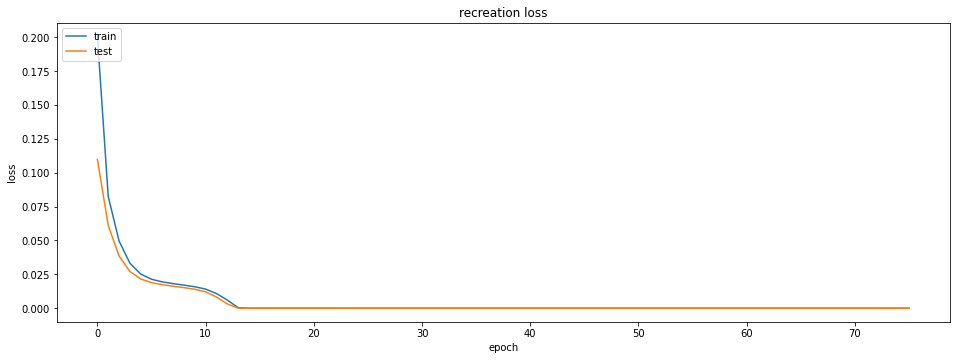

Intlier max value: 1.4624061e-07 Index Val: 2789
outlier max value: 1.8084324e-06 Index Val: 23
outlier min value: 5.0727724e-08 Index Val: 5


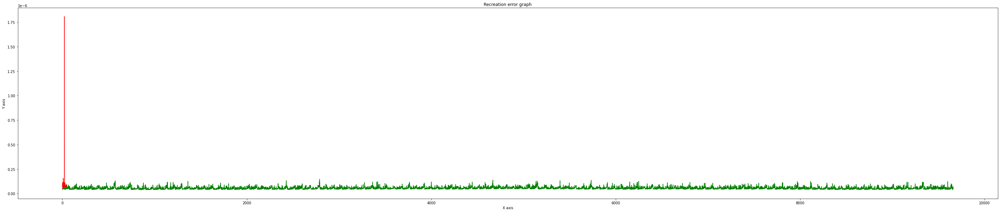

Total member in inlear: 9661
Total False alarm: 4784
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.50      0.67      9661
           1       0.01      0.98      0.02        46

    accuracy                           0.51      9707
   macro avg       0.50      0.74      0.34      9707
weighted avg       1.00      0.51      0.67      9707



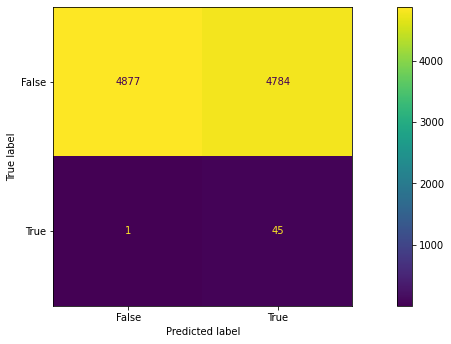

Loss 1.7356811314269728e-14 Validation Loss: 7.800401056043329e-16
dict_keys(['loss', 'val_loss'])


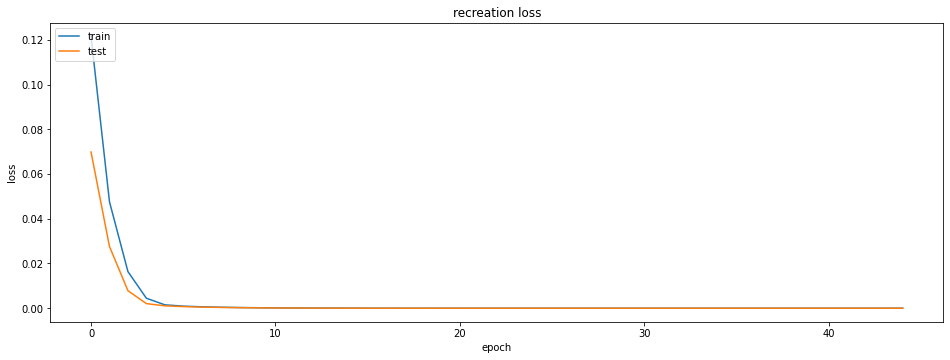

Intlier max value: 8.21565e-15 Index Val: 9337
outlier max value: 8.000545e-15 Index Val: 9
outlier min value: 1.179612e-16 Index Val: 16


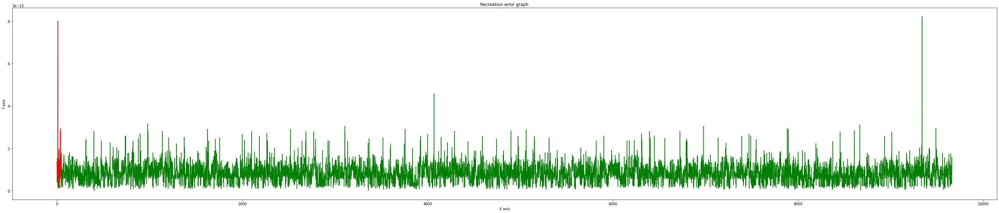

Total member in inlear: 9661
Total False alarm: 9553
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       0.99      0.01      0.02      9661
           1       0.00      0.98      0.01        46

    accuracy                           0.02      9707
   macro avg       0.50      0.49      0.02      9707
weighted avg       0.99      0.02      0.02      9707



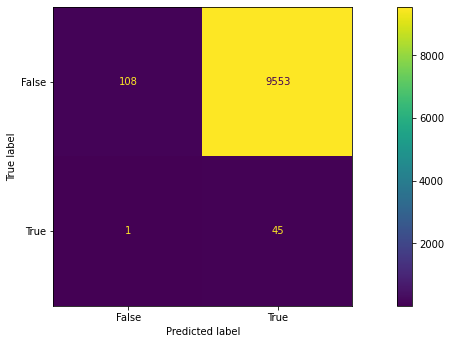

Loss 4.023466360081329e-08 Validation Loss: 1.8841289417537155e-08
dict_keys(['loss', 'val_loss'])


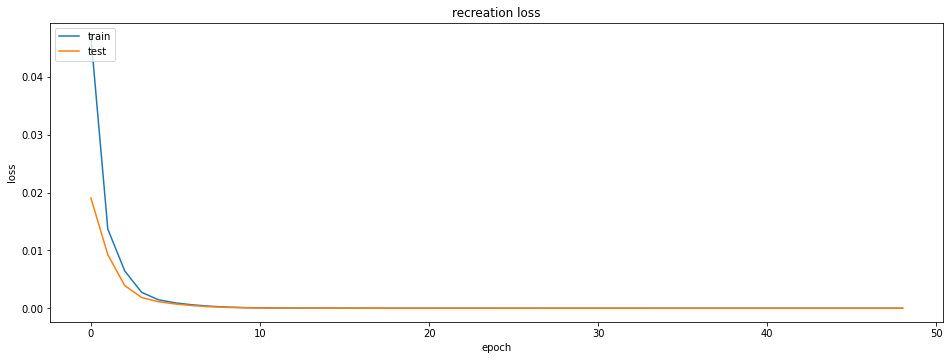

Intlier max value: 1.0031789e-07 Index Val: 6250
outlier max value: 1.1509158e-07 Index Val: 24
outlier min value: 1.6442355e-08 Index Val: 38


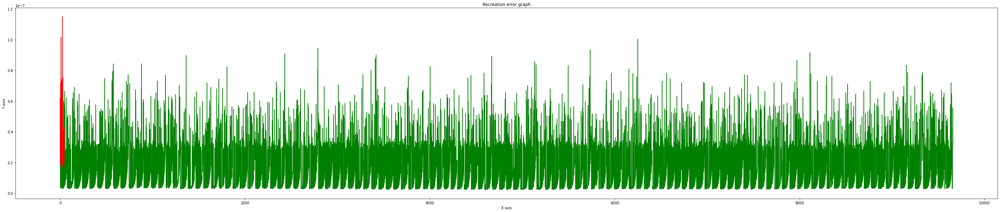

Total member in inlear: 9661
Total False alarm: 4285
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.56      0.71      9661
           1       0.01      0.98      0.02        46

    accuracy                           0.56      9707
   macro avg       0.51      0.77      0.37      9707
weighted avg       1.00      0.56      0.71      9707



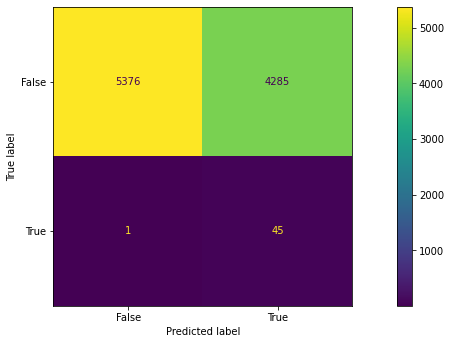

Loss 8.040272092557643e-08 Validation Loss: 6.540253849607325e-08
dict_keys(['loss', 'val_loss'])


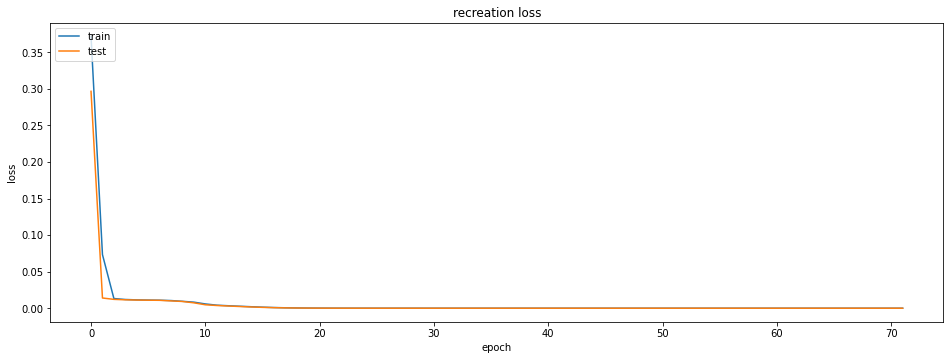

Intlier max value: 1.7739208e-07 Index Val: 6250
outlier max value: 1.6625147e-07 Index Val: 9
outlier min value: 5.5459182e-08 Index Val: 38


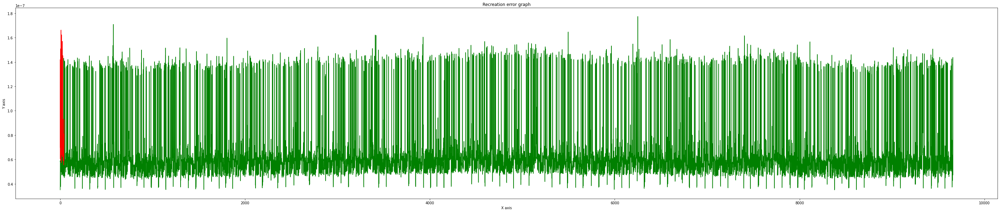

Total member in inlear: 9661
Total False alarm: 6114
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.37      0.54      9661
           1       0.01      0.98      0.01        46

    accuracy                           0.37      9707
   macro avg       0.50      0.67      0.28      9707
weighted avg       1.00      0.37      0.53      9707



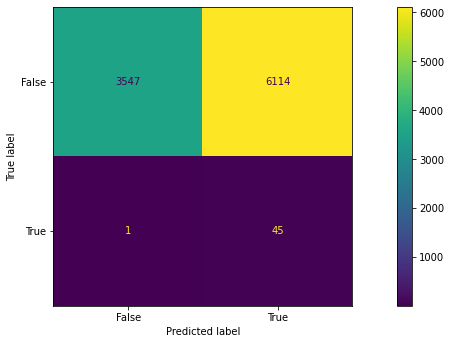

Loss 3.404332460377191e-08 Validation Loss: 1.3365023532330156e-09
dict_keys(['loss', 'val_loss'])


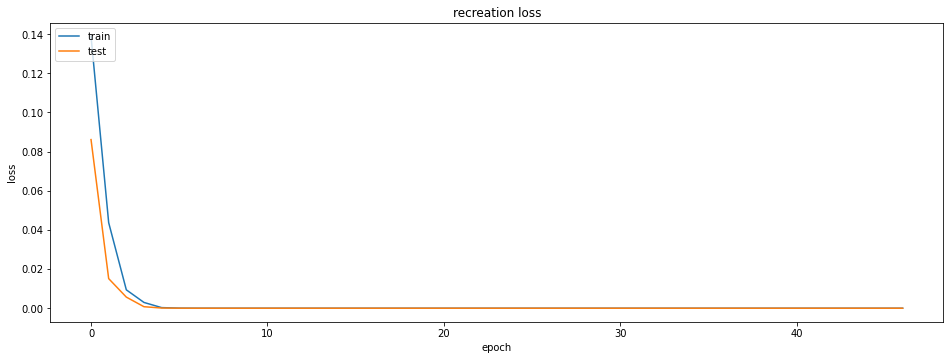

Intlier max value: 1.4203754e-06 Index Val: 9337
outlier max value: 9.303781e-10 Index Val: 24
outlier min value: 9.613356e-11 Index Val: 40


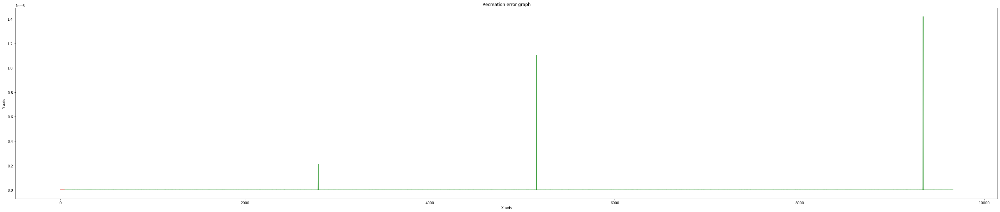

Total member in inlear: 9661
Total False alarm: 7163
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.26      0.41      9661
           1       0.01      0.98      0.01        46

    accuracy                           0.26      9707
   macro avg       0.50      0.62      0.21      9707
weighted avg       0.99      0.26      0.41      9707



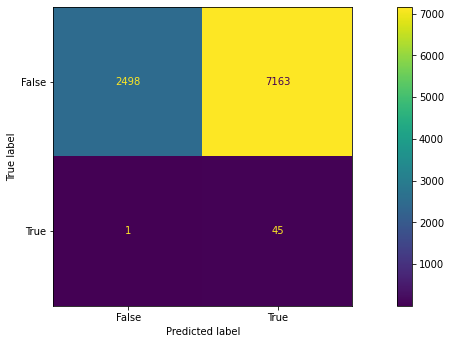

Loss 4.200109771090865e-08 Validation Loss: 1.0547488216161582e-07
dict_keys(['loss', 'val_loss'])


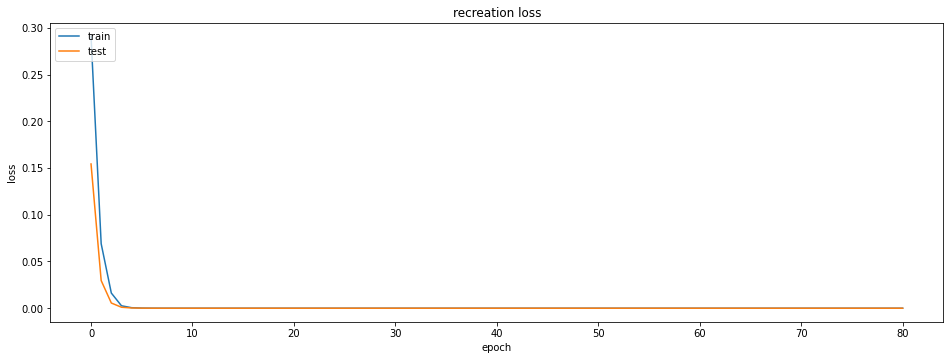

Intlier max value: 3.0452327e-07 Index Val: 2789
outlier max value: 3.2796243e-07 Index Val: 9
outlier min value: 1.2338104e-07 Index Val: 5


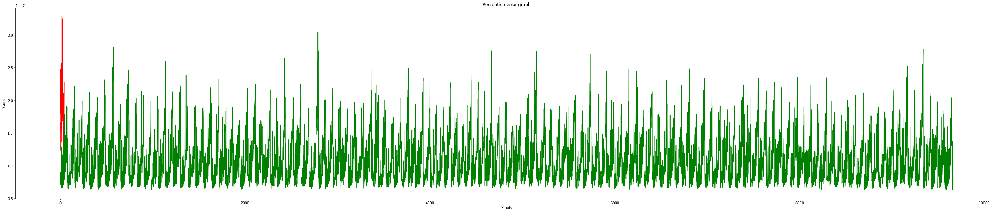

Total member in inlear: 9661
Total False alarm: 2537
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.74      0.85      9661
           1       0.02      0.98      0.03        46

    accuracy                           0.74      9707
   macro avg       0.51      0.86      0.44      9707
weighted avg       1.00      0.74      0.84      9707



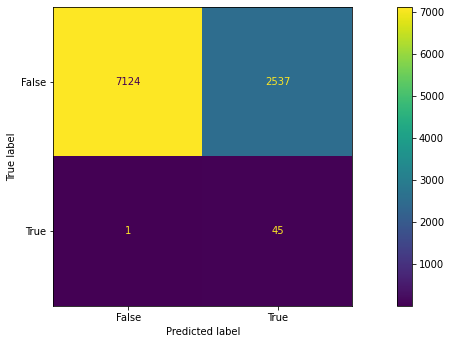

Loss 1.9144691189884426e-14 Validation Loss: 1.42182964078634e-13
dict_keys(['loss', 'val_loss'])


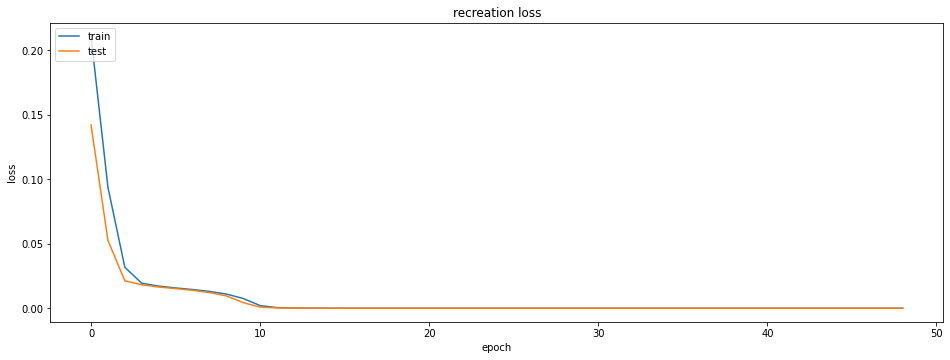

Intlier max value: 2.1038187e-13 Index Val: 6806
outlier max value: 2.1208035e-13 Index Val: 9
outlier min value: 1.3422596e-13 Index Val: 40


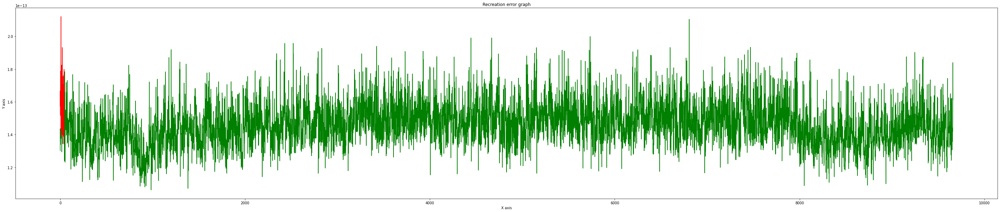

Total member in inlear: 9661
Total False alarm: 7698
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.20      0.34      9661
           1       0.01      0.98      0.01        46

    accuracy                           0.21      9707
   macro avg       0.50      0.59      0.17      9707
weighted avg       0.99      0.21      0.34      9707



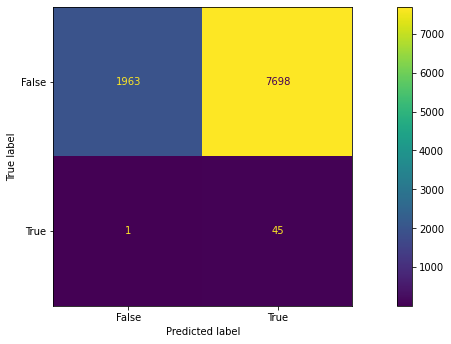

Loss 0.011690902523696423 Validation Loss: 0.011198166757822037
dict_keys(['loss', 'val_loss'])


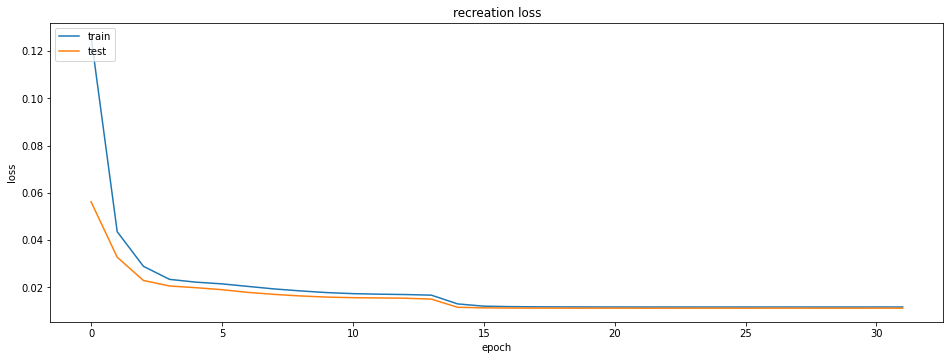

Intlier max value: 0.19318798 Index Val: 6342
outlier max value: 0.29494408 Index Val: 23
outlier min value: 0.005232921 Index Val: 43


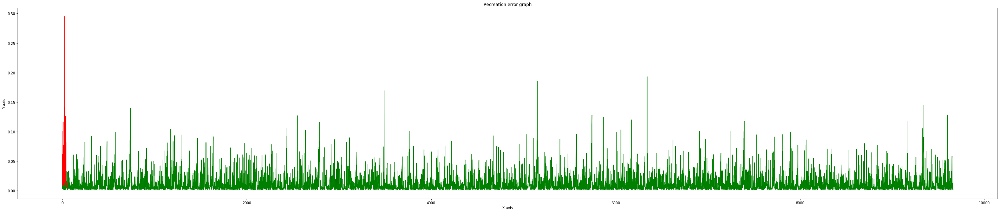

Total member in inlear: 9661
Total False alarm: 5017
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.48      0.65      9661
           1       0.01      0.98      0.02        46

    accuracy                           0.48      9707
   macro avg       0.50      0.73      0.33      9707
weighted avg       1.00      0.48      0.65      9707



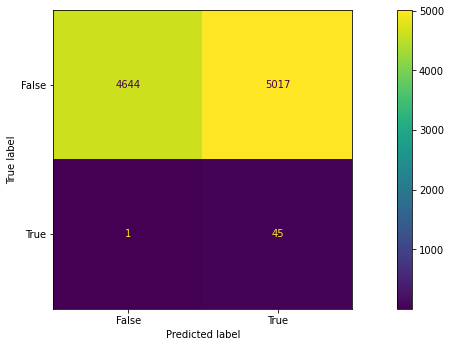

Loss 3.7819400944272275e-08 Validation Loss: 3.326079678345195e-08
dict_keys(['loss', 'val_loss'])


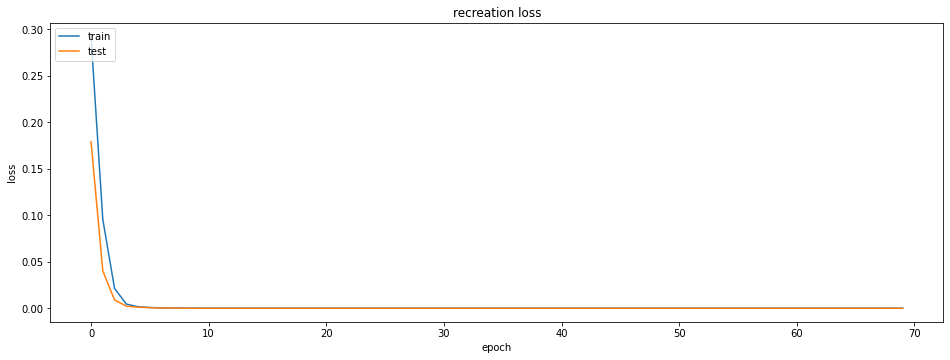

Intlier max value: 1.402972e-07 Index Val: 6250
outlier max value: 9.848546e-08 Index Val: 24
outlier min value: 2.5312769e-08 Index Val: 12


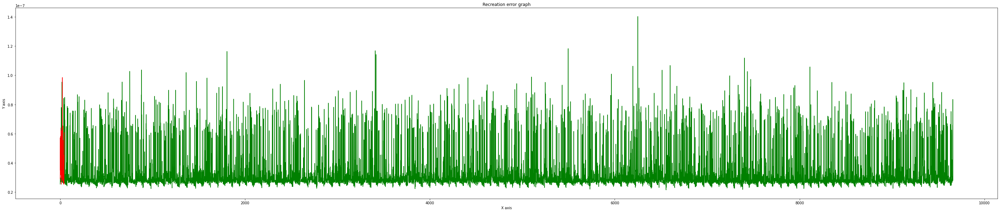

Total member in inlear: 9661
Total False alarm: 8881
Total member in Outlier: 46
Total missed true alarm: 3
              precision    recall  f1-score   support

           0       1.00      0.08      0.15      9661
           1       0.00      0.93      0.01        46

    accuracy                           0.08      9707
   macro avg       0.50      0.51      0.08      9707
weighted avg       0.99      0.08      0.15      9707



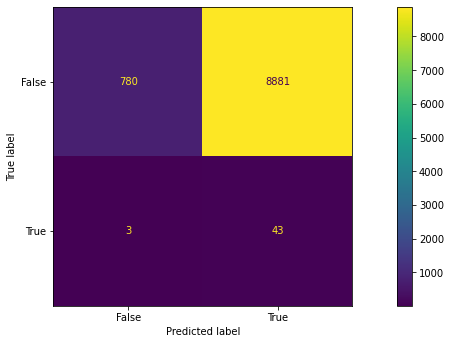

Loss 7.408435465094954e-08 Validation Loss: 7.012904035264e-08
dict_keys(['loss', 'val_loss'])


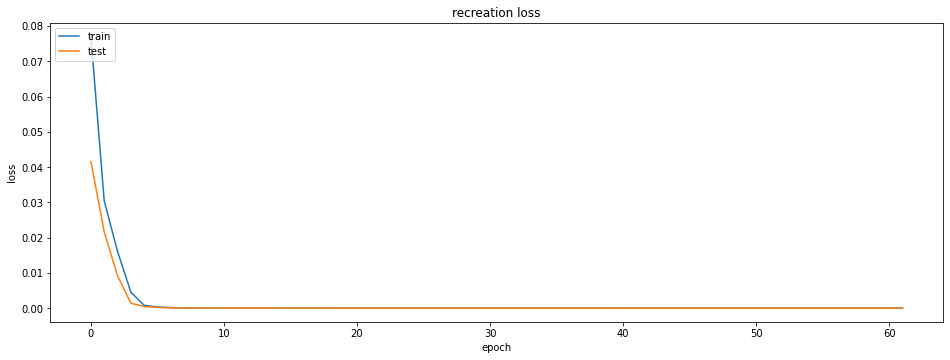

Intlier max value: 3.4539772e-07 Index Val: 2789
outlier max value: 3.6875127e-07 Index Val: 9
outlier min value: 5.7989666e-08 Index Val: 40


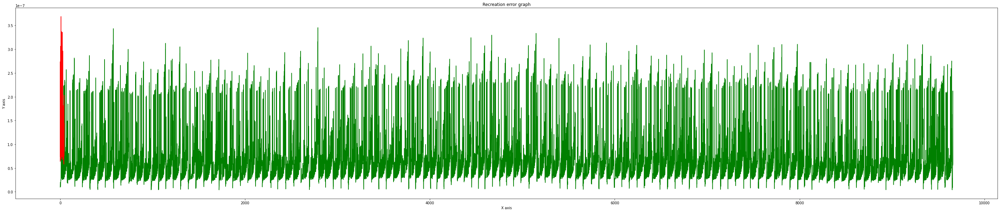

Total member in inlear: 9661
Total False alarm: 4183
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.57      0.72      9661
           1       0.01      0.98      0.02        46

    accuracy                           0.57      9707
   macro avg       0.51      0.77      0.37      9707
weighted avg       1.00      0.57      0.72      9707



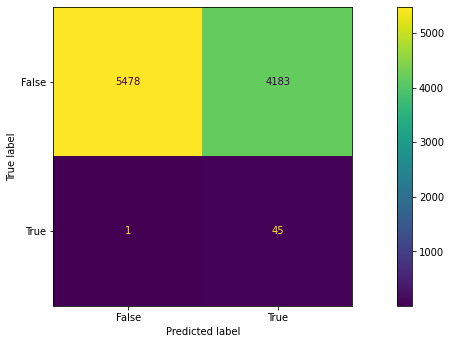

Loss 0.18724623322486877 Validation Loss: 0.18405234813690186
dict_keys(['loss', 'val_loss'])


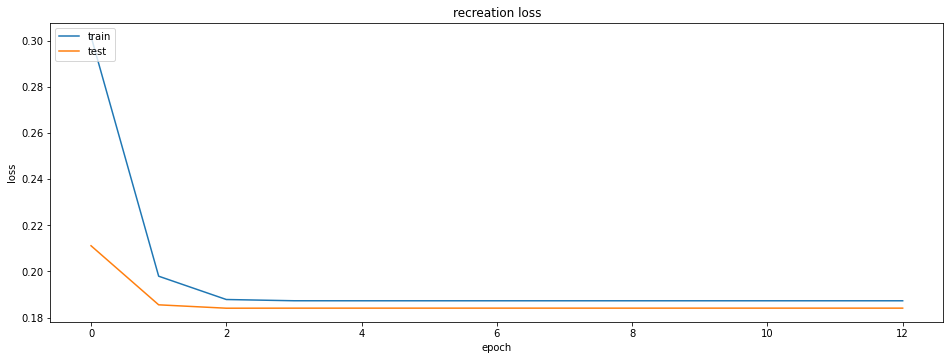

Intlier max value: 0.24489513 Index Val: 4914
outlier max value: 0.22477555 Index Val: 23
outlier min value: 0.1693081 Index Val: 38


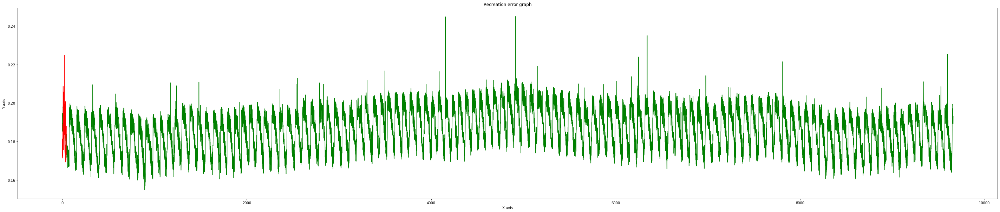

Total member in inlear: 9661
Total False alarm: 8813
Total member in Outlier: 46
Total missed true alarm: 2
              precision    recall  f1-score   support

           0       1.00      0.09      0.16      9661
           1       0.00      0.96      0.01        46

    accuracy                           0.09      9707
   macro avg       0.50      0.52      0.09      9707
weighted avg       0.99      0.09      0.16      9707



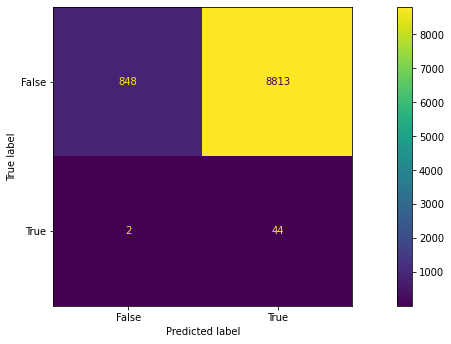

Loss 0.3789018392562866 Validation Loss: 0.3709942698478699
dict_keys(['loss', 'val_loss'])


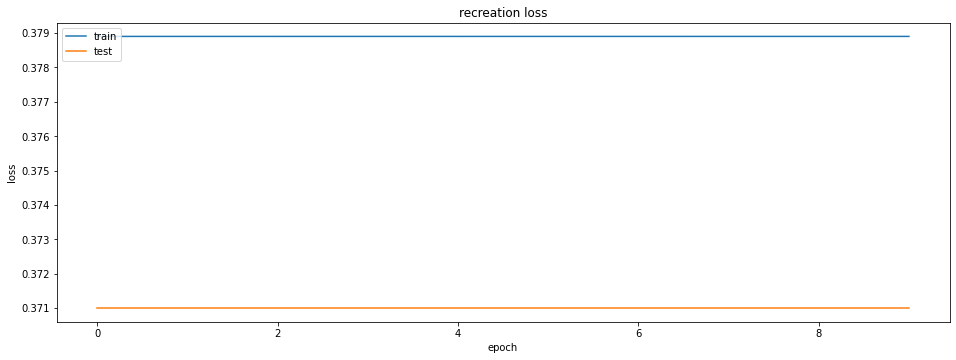

Intlier max value: 0.5035227 Index Val: 5156
outlier max value: 0.5466257 Index Val: 23
outlier min value: 0.38738725 Index Val: 5


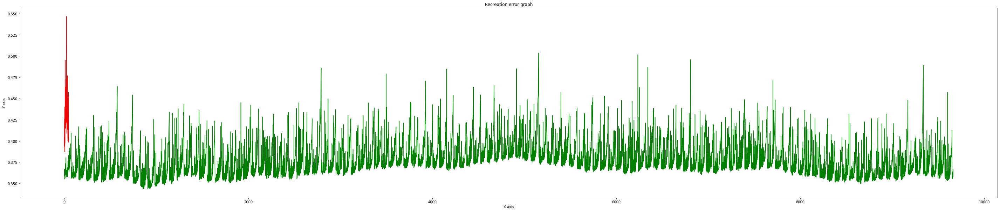

Total member in inlear: 9661
Total False alarm: 1853
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.81      0.89      9661
           1       0.02      0.98      0.05        46

    accuracy                           0.81      9707
   macro avg       0.51      0.89      0.47      9707
weighted avg       1.00      0.81      0.89      9707



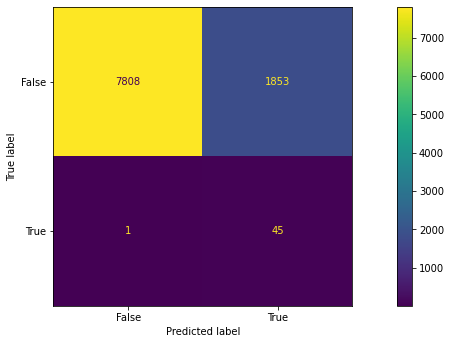

trecall_max: 0.8081979091191388 frecall_max: 0.9782608695652174 Count: 5


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m2/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m2/assets


In [ ]:
import tensorflow as tf
from tensorflow import keras
from keras import layers
from tensorflow.keras import regularizers
import numpy as np
e = 1000
# Load the training and test data
train_inlear_all, test_outlier_all,rd = rawDataload_TWF()
train_inlear = train_inlear_all
test_outlier = test_outlier_all
# amplify the diffrences 
trn = np.power(train_inlear.values, 3)
tst = np.power(test_outlier.values, 3)

# nomalize by dividing max value of train matrix
max_value = np.max(trn,axis = 0)
print(max_value)
trainN = (trn/max_value)
testN = (tst/max_value)

# Generate and train the model
train_2 = trainN.reshape(len(trainN),1,8,1)
# Input for  looping:
trecall_max = 0.0
frecall_max = 0.0
count = 0
from google.colab import drive
drive.mount('/content/gdrive')
m1_path = '/content/gdrive/MyDrive/outlier_models/m2'
while count < 5:
  m1,history = m3_2dcnnae_single_conv(train_2,e)
  MODEL1 = m1
  X_test_2 = testN.reshape(len(testN),1,8,1)
  # Output analysis
  ## Plot the model training and validation 
  print("Loss",list(history.history['loss'])[-1],"Validation Loss:",list(history.history['val_loss'])[-1])
  plt_model_accuracy(history)
  inlier_lst,outlier_lst = model_analysis(train_2,X_test_2,MODEL1)
  #outlier cut-off point:
  oc = min(outlier_lst)
  oc = oc+oc*(1/100)
  mat1 = confusionMatrix(oc,inlier_lst,outlier_lst)
  trecall = mat1['0']['recall']
  frecall = mat1['1']['recall']
  if trecall_max <= trecall and frecall_max <= frecall:
    trecall_max = trecall
    frecall_max = frecall
    count+=1
    print("trecall_max:",trecall_max,'frecall_max:',frecall_max, 'Count:',count)
    m1.save(m1_path)
    if count == 5:
      break




## CNN-AE Undercomplete model

[ 304.5  313.8 2695.    70.   246.     1.     1.     1. ]
Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
Epoch 1/1000
242/242 [==============================] - 12s 48ms/step - loss: 10337.0215 - val_loss: 2262.3911
Epoch 2/1000
242/242 [==============================] - 12s 48ms/step - loss: 2390.8013 - val_loss: 2213.1982
Epoch 3/1000
242/242 [==============================] - 13s 53ms/step - loss: 2239.7849 - val_loss: 2028.9521
Epoch 4/1000
242/242 [==============================] - 12s 48ms/step - loss: 2152.9204 - val_loss: 2029.1017
Epoch 5/1000
242/242 [==============================] - 12s 48ms/step - loss: 2152.0593 - val_loss: 2026.5917
Epoch 6/1000
242/242 [==============================] - 12s 48ms/step - loss: 2151.6331 - val_loss: 2026.3782
Epoch 7/1000
242/242 [==============================] - 11s 47ms/step - loss: 2151.5347 - val_loss: 2027.4839
Epoch 8/1000
242/242 [==================

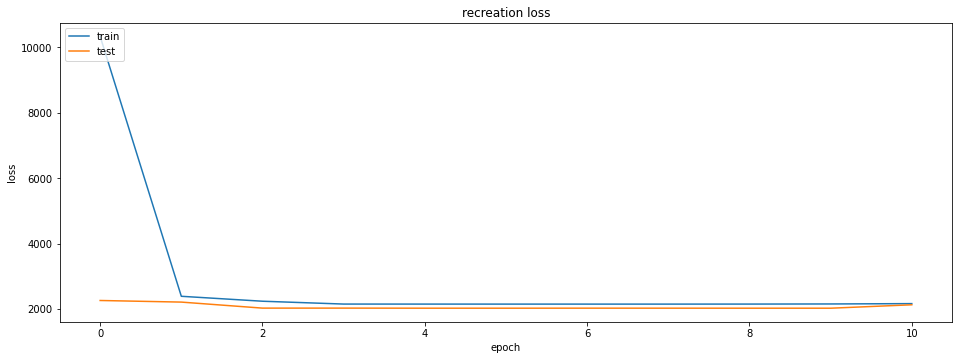

Intlier max value: 7896.7495 Index Val: 9337
outlier max value: 8470.304 Index Val: 23
outlier min value: 5171.5957 Index Val: 5


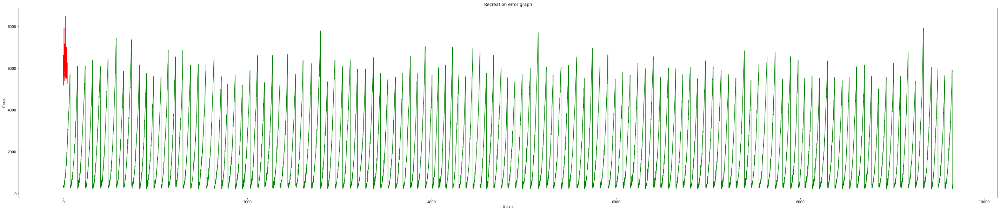

Total member in inlear: 9661
Total False alarm: 734
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.92      0.96      9661
           1       0.06      0.98      0.11        46

    accuracy                           0.92      9707
   macro avg       0.53      0.95      0.53      9707
weighted avg       1.00      0.92      0.96      9707



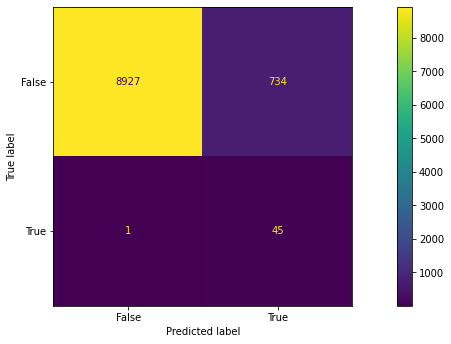

trecall_max: 0.9240244281130318 frecall_max: 0.9782608695652174 Count: 1


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m2_undercomplete/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m2_undercomplete/assets


Epoch 1/1000
242/242 [==============================] - 14s 57ms/step - loss: 254530.5000 - val_loss: 2408.8599
Epoch 2/1000
242/242 [==============================] - 12s 51ms/step - loss: 2400.8284 - val_loss: 2228.4204
Epoch 3/1000
242/242 [==============================] - 13s 52ms/step - loss: 2345.4612 - val_loss: 2171.6013
Epoch 4/1000
242/242 [==============================] - 12s 50ms/step - loss: 2245.4683 - val_loss: 2039.4873
Epoch 5/1000
242/242 [==============================] - 12s 50ms/step - loss: 2154.7993 - val_loss: 2027.5448
Epoch 6/1000
242/242 [==============================] - 12s 50ms/step - loss: 2152.4390 - val_loss: 2026.9493
Epoch 7/1000
242/242 [==============================] - 12s 50ms/step - loss: 2151.9712 - val_loss: 2026.6605
Epoch 8/1000
242/242 [==============================] - 12s 50ms/step - loss: 2151.7339 - val_loss: 2026.4855
Epoch 9/1000
242/242 [==============================] - 12s 50ms/step - loss: 2151.5999 - val_loss: 2026.7720
Epoch 10

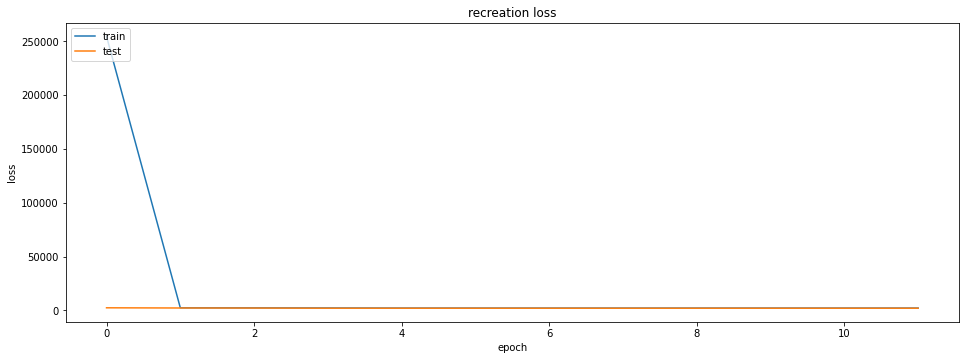

Intlier max value: 7809.773 Index Val: 9337
outlier max value: 8386.677 Index Val: 23
outlier min value: 5083.7017 Index Val: 5


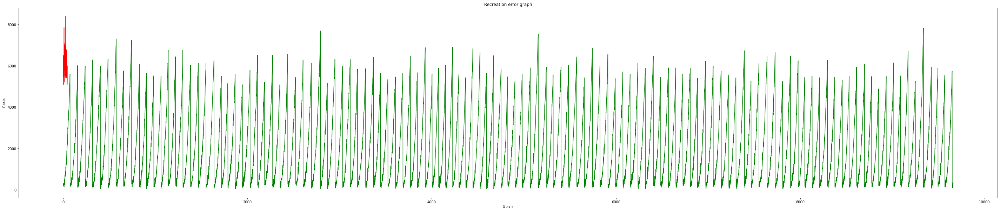

Total member in inlear: 9661
Total False alarm: 715
Total member in Outlier: 46
Total missed true alarm: 2
              precision    recall  f1-score   support

           0       1.00      0.93      0.96      9661
           1       0.06      0.96      0.11        46

    accuracy                           0.93      9707
   macro avg       0.53      0.94      0.54      9707
weighted avg       1.00      0.93      0.96      9707



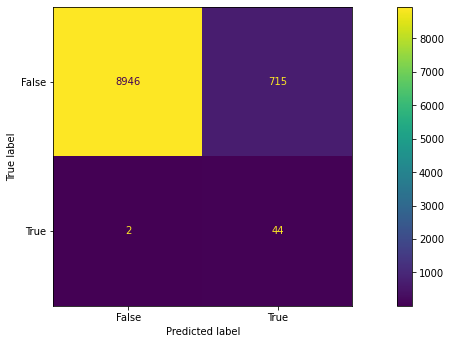

Epoch 1/1000
242/242 [==============================] - 13s 52ms/step - loss: 20395.9160 - val_loss: 14103.5889
Epoch 2/1000
242/242 [==============================] - 13s 52ms/step - loss: 14282.4766 - val_loss: 14026.7285
Epoch 3/1000
242/242 [==============================] - 12s 51ms/step - loss: 14183.9678 - val_loss: 13991.5469
Epoch 4/1000
242/242 [==============================] - 13s 52ms/step - loss: 14178.5146 - val_loss: 13992.6621
Epoch 5/1000
242/242 [==============================] - 14s 57ms/step - loss: 14177.9521 - val_loss: 13991.1113
Epoch 6/1000
242/242 [==============================] - 12s 51ms/step - loss: 14177.8633 - val_loss: 13990.0117
Epoch 7/1000
242/242 [==============================] - 13s 52ms/step - loss: 14177.3662 - val_loss: 13989.7607
Epoch 8/1000
242/242 [==============================] - 13s 52ms/step - loss: 14177.9834 - val_loss: 13999.3389
Epoch 9/1000
242/242 [==============================] - 12s 51ms/step - loss: 14179.8623 - val_loss: 139

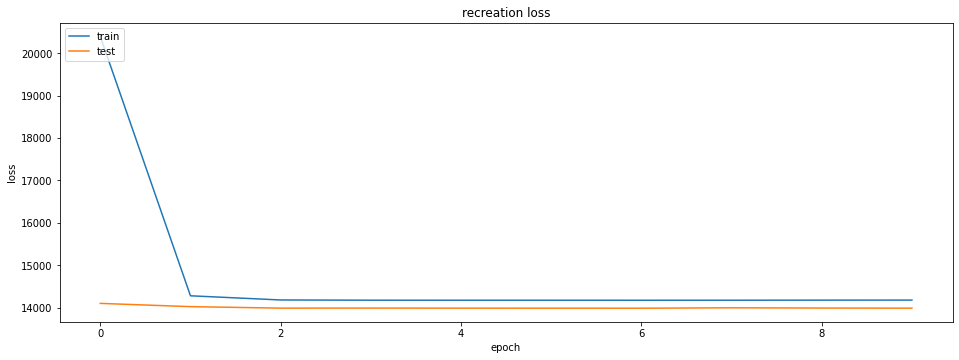

Intlier max value: 19836.57 Index Val: 9337
outlier max value: 20576.355 Index Val: 23
outlier min value: 16943.398 Index Val: 5


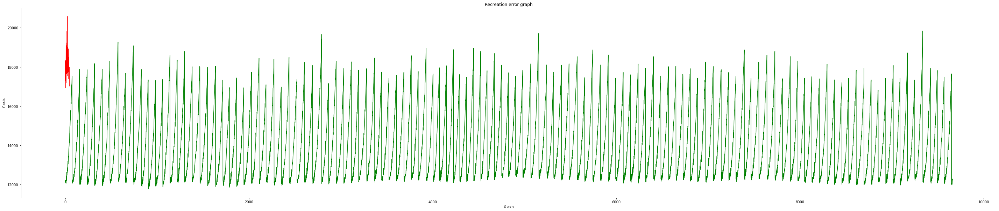

Total member in inlear: 9661
Total False alarm: 755
Total member in Outlier: 46
Total missed true alarm: 2
              precision    recall  f1-score   support

           0       1.00      0.92      0.96      9661
           1       0.06      0.96      0.10        46

    accuracy                           0.92      9707
   macro avg       0.53      0.94      0.53      9707
weighted avg       1.00      0.92      0.96      9707



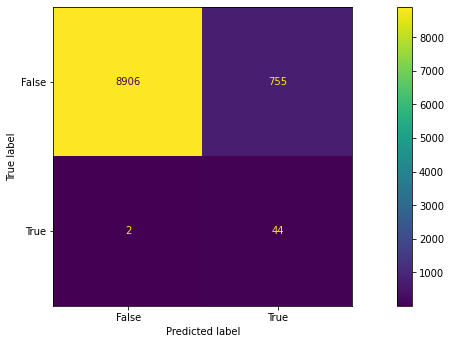

Epoch 1/1000
242/242 [==============================] - 13s 52ms/step - loss: 8902.8154 - val_loss: 2059.5457
Epoch 2/1000
242/242 [==============================] - 12s 51ms/step - loss: 2115.1484 - val_loss: 1865.2097
Epoch 3/1000
242/242 [==============================] - 14s 58ms/step - loss: 1961.7040 - val_loss: 1825.1512
Epoch 4/1000
242/242 [==============================] - 12s 51ms/step - loss: 1948.4022 - val_loss: 1827.5278
Epoch 5/1000
242/242 [==============================] - 12s 50ms/step - loss: 1948.2280 - val_loss: 1820.5192
Epoch 6/1000
242/242 [==============================] - 12s 50ms/step - loss: 1947.4844 - val_loss: 1823.9895
Epoch 7/1000
242/242 [==============================] - 12s 51ms/step - loss: 1947.4117 - val_loss: 1820.7180
Epoch 8/1000
242/242 [==============================] - 12s 52ms/step - loss: 1947.7177 - val_loss: 1829.8915
Epoch 9/1000
242/242 [==============================] - 13s 52ms/step - loss: 1947.9727 - val_loss: 1821.4628
Epoch 10/1

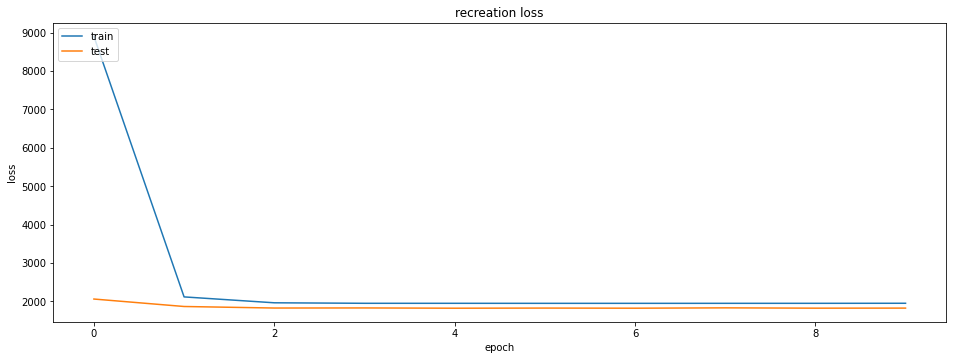

Intlier max value: 7571.1855 Index Val: 9337
outlier max value: 8015.8975 Index Val: 23
outlier min value: 4911.6206 Index Val: 5


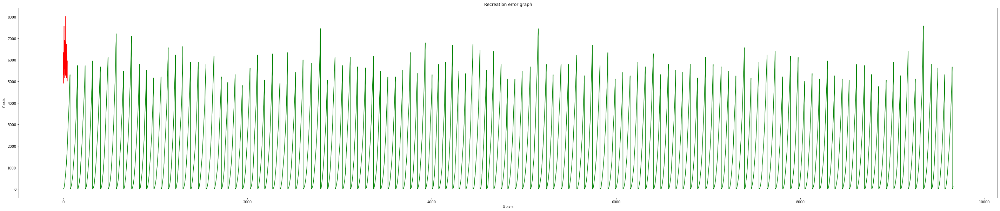

Total member in inlear: 9661
Total False alarm: 683
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.93      0.96      9661
           1       0.06      0.98      0.12        46

    accuracy                           0.93      9707
   macro avg       0.53      0.95      0.54      9707
weighted avg       1.00      0.93      0.96      9707



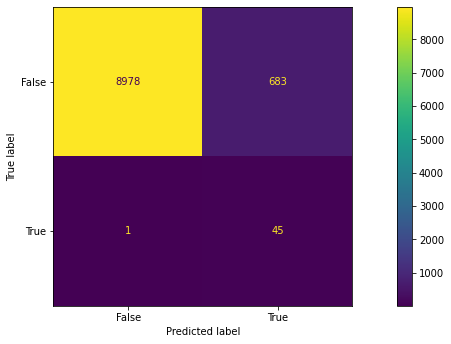

trecall_max: 0.9293033847427803 frecall_max: 0.9782608695652174 Count: 2


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m2_undercomplete/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m2_undercomplete/assets


Epoch 1/1000
242/242 [==============================] - 15s 58ms/step - loss: 8685.5049 - val_loss: 2248.3677
Epoch 2/1000
242/242 [==============================] - 13s 53ms/step - loss: 2227.0474 - val_loss: 2033.3226
Epoch 3/1000
242/242 [==============================] - 13s 55ms/step - loss: 2152.8711 - val_loss: 2027.6224
Epoch 4/1000
242/242 [==============================] - 14s 57ms/step - loss: 2152.1785 - val_loss: 2026.7616
Epoch 5/1000
242/242 [==============================] - 14s 57ms/step - loss: 2152.2593 - val_loss: 2026.6179
Epoch 6/1000
242/242 [==============================] - 14s 57ms/step - loss: 2151.9338 - val_loss: 2026.6945
Epoch 7/1000
242/242 [==============================] - 14s 57ms/step - loss: 2152.0713 - val_loss: 2026.8038
Epoch 8/1000
242/242 [==============================] - 14s 58ms/step - loss: 2152.2725 - val_loss: 2026.3723
Epoch 9/1000
242/242 [==============================] - 14s 58ms/step - loss: 2152.2869 - val_loss: 2028.5366
Loss 2152.

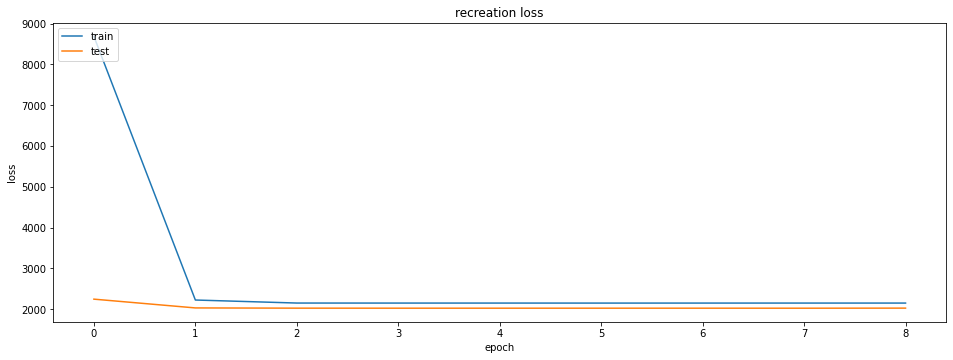

Intlier max value: 7810.4434 Index Val: 9337
outlier max value: 8387.808 Index Val: 23
outlier min value: 5083.2075 Index Val: 5


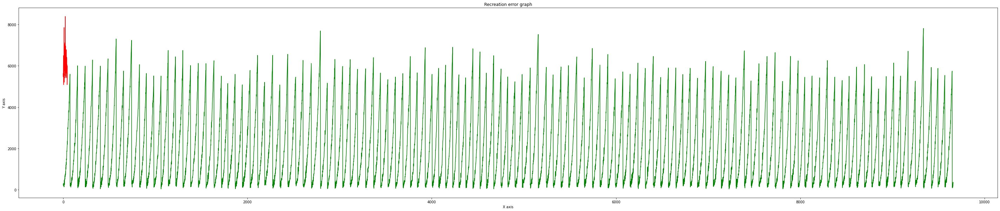

Total member in inlear: 9661
Total False alarm: 715
Total member in Outlier: 46
Total missed true alarm: 2
              precision    recall  f1-score   support

           0       1.00      0.93      0.96      9661
           1       0.06      0.96      0.11        46

    accuracy                           0.93      9707
   macro avg       0.53      0.94      0.54      9707
weighted avg       1.00      0.93      0.96      9707



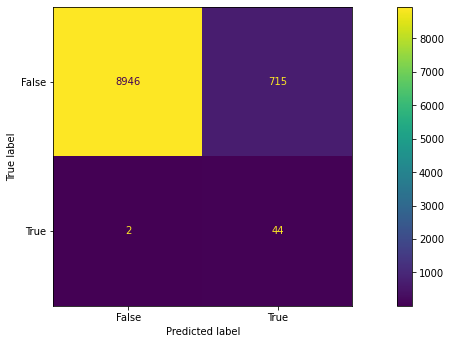

Epoch 1/1000
242/242 [==============================] - 16s 63ms/step - loss: 325979.9688 - val_loss: 323277.7188
Epoch 2/1000
242/242 [==============================] - 14s 59ms/step - loss: 325979.6875 - val_loss: 323277.7188
Epoch 3/1000
242/242 [==============================] - 14s 59ms/step - loss: 325980.0625 - val_loss: 323277.7188
Epoch 4/1000
242/242 [==============================] - 14s 59ms/step - loss: 325979.8125 - val_loss: 323277.7188
Epoch 5/1000
242/242 [==============================] - 14s 59ms/step - loss: 325979.7500 - val_loss: 323277.7188
Loss 325979.75 Validation Loss: 323277.71875
dict_keys(['loss', 'val_loss'])


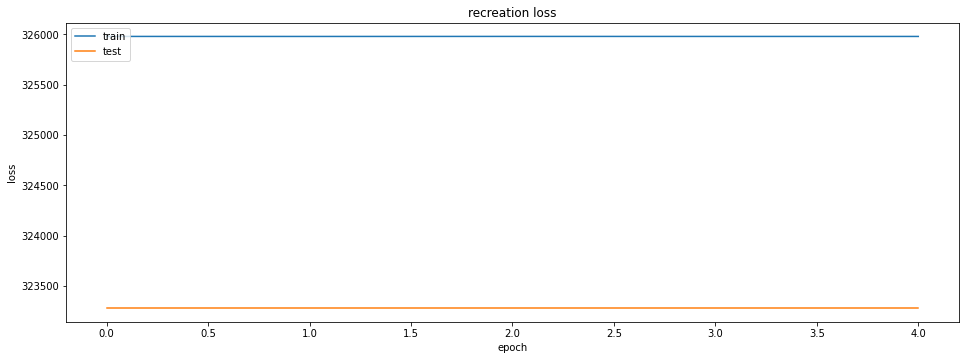

Intlier max value: 931308.75 Index Val: 4155
outlier max value: 673795.8 Index Val: 45
outlier min value: 247323.88 Index Val: 40


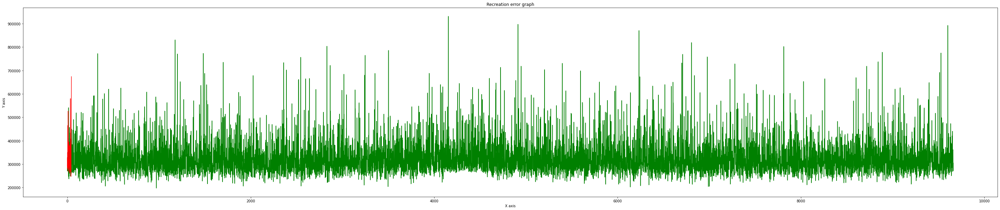

Total member in inlear: 9661
Total False alarm: 9166
Total member in Outlier: 46
Total missed true alarm: 2
              precision    recall  f1-score   support

           0       1.00      0.05      0.10      9661
           1       0.00      0.96      0.01        46

    accuracy                           0.06      9707
   macro avg       0.50      0.50      0.05      9707
weighted avg       0.99      0.06      0.10      9707



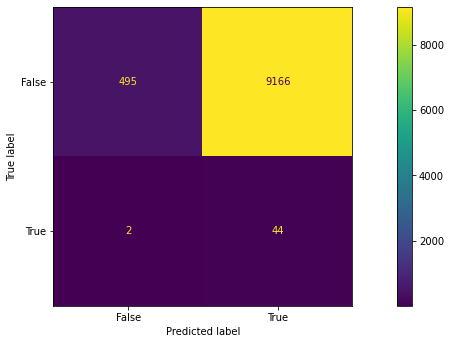

Epoch 1/1000
242/242 [==============================] - 15s 61ms/step - loss: 11790.4551 - val_loss: 2283.8782
Epoch 2/1000
242/242 [==============================] - 15s 60ms/step - loss: 2329.4585 - val_loss: 2098.0776
Epoch 3/1000
242/242 [==============================] - 16s 65ms/step - loss: 2170.8274 - val_loss: 2030.1561
Epoch 4/1000
242/242 [==============================] - 14s 60ms/step - loss: 2154.9602 - val_loss: 2027.9745
Epoch 5/1000
242/242 [==============================] - 15s 60ms/step - loss: 2152.9614 - val_loss: 2028.3888
Epoch 6/1000
242/242 [==============================] - 15s 60ms/step - loss: 2152.4463 - val_loss: 2027.5448
Epoch 7/1000
242/242 [==============================] - 15s 60ms/step - loss: 2152.1047 - val_loss: 2028.0452
Epoch 8/1000
242/242 [==============================] - 14s 60ms/step - loss: 2152.9675 - val_loss: 2029.2885
Epoch 9/1000
242/242 [==============================] - 15s 60ms/step - loss: 2160.7332 - val_loss: 2090.1882
Epoch 10/

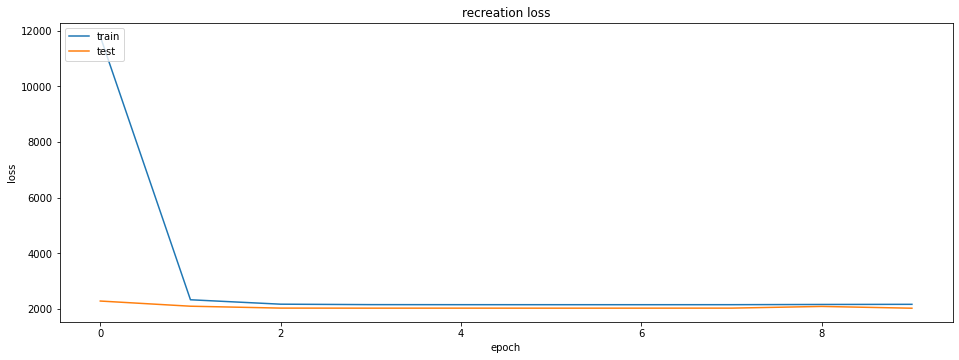

Intlier max value: 7808.6416 Index Val: 9337
outlier max value: 8378.965 Index Val: 23
outlier min value: 5082.1807 Index Val: 43


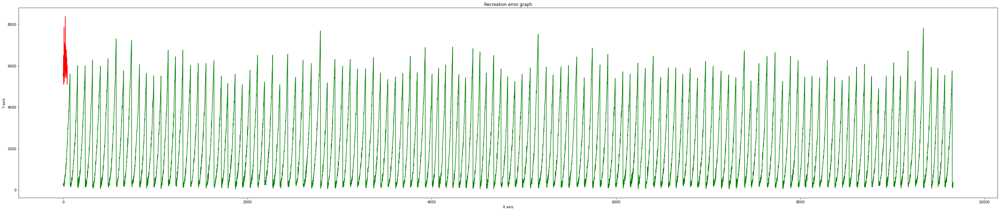

Total member in inlear: 9661
Total False alarm: 714
Total member in Outlier: 46
Total missed true alarm: 2
              precision    recall  f1-score   support

           0       1.00      0.93      0.96      9661
           1       0.06      0.96      0.11        46

    accuracy                           0.93      9707
   macro avg       0.53      0.94      0.54      9707
weighted avg       1.00      0.93      0.96      9707



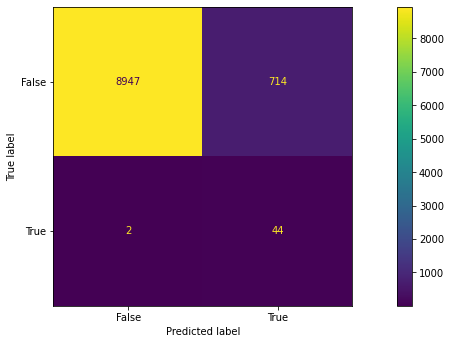

Epoch 1/1000
242/242 [==============================] - 16s 62ms/step - loss: 73240.7500 - val_loss: 13279.6553
Epoch 2/1000
242/242 [==============================] - 15s 62ms/step - loss: 13561.8779 - val_loss: 13275.5283
Epoch 3/1000
242/242 [==============================] - 14s 60ms/step - loss: 13542.4492 - val_loss: 13218.9453
Epoch 4/1000
242/242 [==============================] - 14s 59ms/step - loss: 13444.5410 - val_loss: 13154.6689
Epoch 5/1000
242/242 [==============================] - 14s 60ms/step - loss: 13430.2812 - val_loss: 13154.1836
Epoch 6/1000
242/242 [==============================] - 15s 61ms/step - loss: 13430.0723 - val_loss: 13154.0879
Epoch 7/1000
242/242 [==============================] - 15s 62ms/step - loss: 13429.8672 - val_loss: 13153.7920
Epoch 8/1000
242/242 [==============================] - 15s 62ms/step - loss: 13429.8438 - val_loss: 13153.8008
Epoch 9/1000
242/242 [==============================] - 15s 62ms/step - loss: 13429.8184 - val_loss: 131

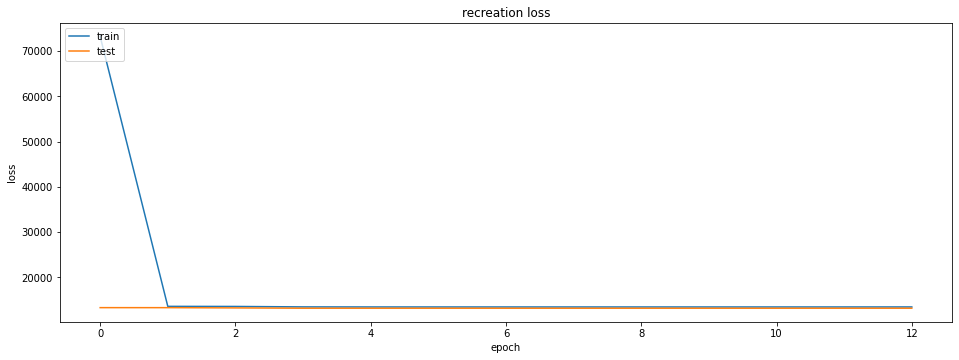

Intlier max value: 18984.576 Index Val: 9337
outlier max value: 19824.406 Index Val: 23
outlier min value: 16168.018 Index Val: 43


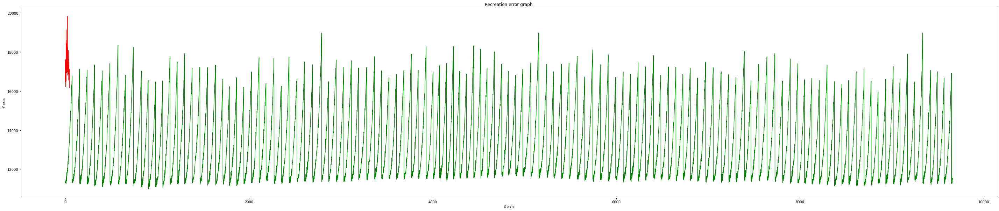

Total member in inlear: 9661
Total False alarm: 781
Total member in Outlier: 46
Total missed true alarm: 2
              precision    recall  f1-score   support

           0       1.00      0.92      0.96      9661
           1       0.05      0.96      0.10        46

    accuracy                           0.92      9707
   macro avg       0.53      0.94      0.53      9707
weighted avg       1.00      0.92      0.95      9707



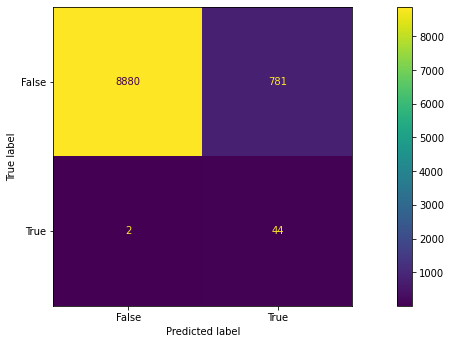

Epoch 1/1000
242/242 [==============================] - 17s 68ms/step - loss: 9237.4072 - val_loss: 2245.2468
Epoch 2/1000
242/242 [==============================] - 15s 63ms/step - loss: 2322.6982 - val_loss: 2073.3049
Epoch 3/1000
242/242 [==============================] - 15s 62ms/step - loss: 2170.1177 - val_loss: 2031.4034
Epoch 4/1000
242/242 [==============================] - 15s 63ms/step - loss: 2156.0115 - val_loss: 2029.1975
Epoch 5/1000
242/242 [==============================] - 15s 63ms/step - loss: 2155.0779 - val_loss: 2029.8051
Epoch 6/1000
242/242 [==============================] - 15s 63ms/step - loss: 2154.3516 - val_loss: 2027.9785
Epoch 7/1000
242/242 [==============================] - 15s 63ms/step - loss: 2153.8525 - val_loss: 2028.4326
Epoch 8/1000
242/242 [==============================] - 15s 63ms/step - loss: 2154.0029 - val_loss: 2028.7502
Epoch 9/1000
242/242 [==============================] - 16s 64ms/step - loss: 2155.1484 - val_loss: 2035.0326
Epoch 10/1

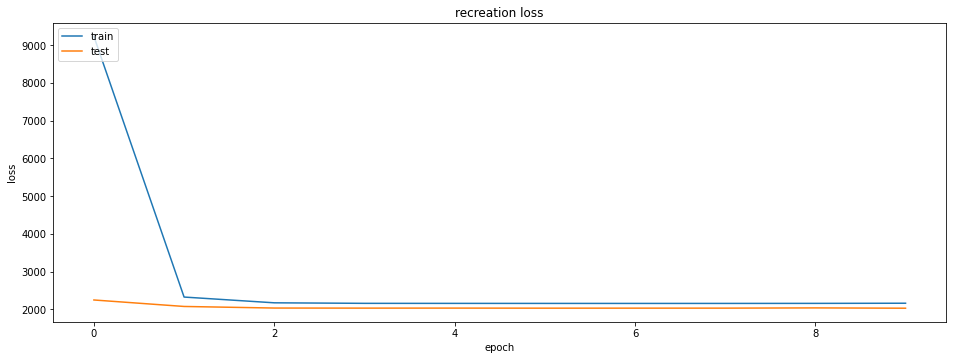

Intlier max value: 7808.28 Index Val: 9337
outlier max value: 8386.034 Index Val: 23
outlier min value: 5083.3296 Index Val: 43


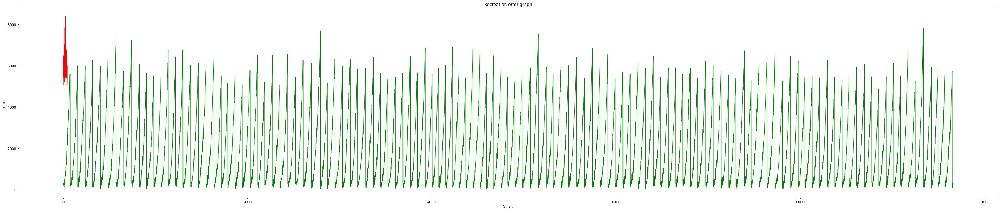

Total member in inlear: 9661
Total False alarm: 714
Total member in Outlier: 46
Total missed true alarm: 2
              precision    recall  f1-score   support

           0       1.00      0.93      0.96      9661
           1       0.06      0.96      0.11        46

    accuracy                           0.93      9707
   macro avg       0.53      0.94      0.54      9707
weighted avg       1.00      0.93      0.96      9707



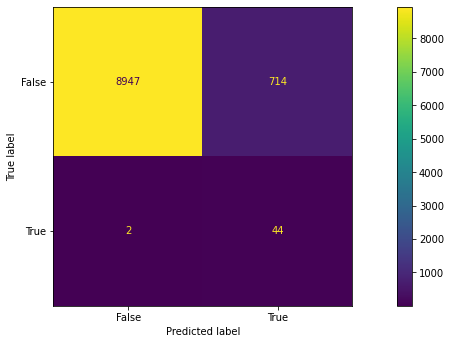

Epoch 1/1000
242/242 [==============================] - 16s 65ms/step - loss: 8258.3584 - val_loss: 2264.8694
Epoch 2/1000
242/242 [==============================] - 15s 64ms/step - loss: 2211.9316 - val_loss: 2026.8883
Epoch 3/1000
242/242 [==============================] - 15s 64ms/step - loss: 2151.7002 - val_loss: 2026.5701
Epoch 4/1000
242/242 [==============================] - 15s 64ms/step - loss: 2151.3635 - val_loss: 2026.5925
Epoch 5/1000
242/242 [==============================] - 15s 64ms/step - loss: 2151.2781 - val_loss: 2026.2892
Epoch 6/1000
242/242 [==============================] - 15s 64ms/step - loss: 2151.3176 - val_loss: 2026.3264
Epoch 7/1000
242/242 [==============================] - 17s 68ms/step - loss: 2151.2786 - val_loss: 2026.1680
Epoch 8/1000
242/242 [==============================] - 15s 64ms/step - loss: 2151.4688 - val_loss: 2031.3976
Loss 2151.46875 Validation Loss: 2031.3975830078125
dict_keys(['loss', 'val_loss'])


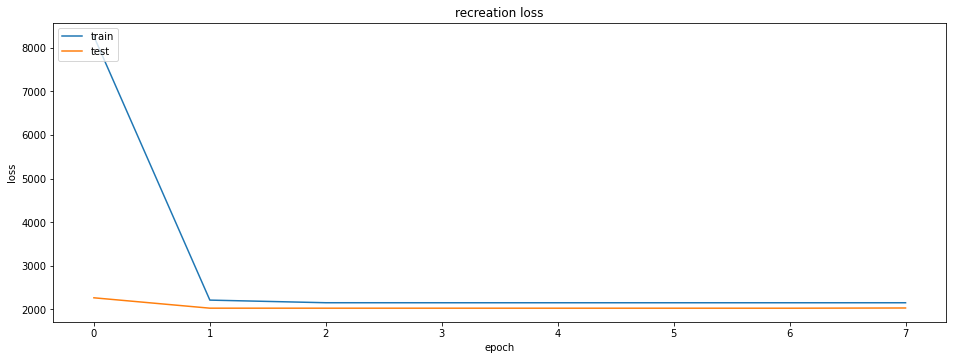

Intlier max value: 7811.992 Index Val: 9337
outlier max value: 8380.023 Index Val: 23
outlier min value: 5089.0166 Index Val: 43


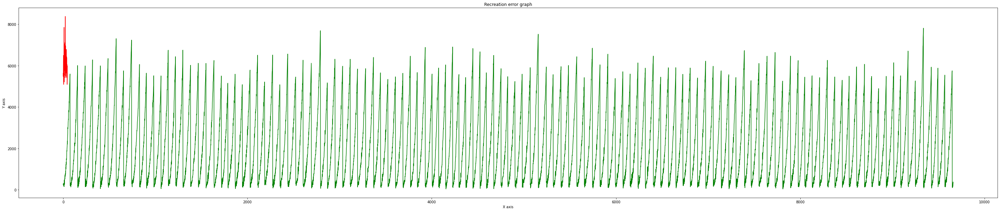

Total member in inlear: 9661
Total False alarm: 713
Total member in Outlier: 46
Total missed true alarm: 2
              precision    recall  f1-score   support

           0       1.00      0.93      0.96      9661
           1       0.06      0.96      0.11        46

    accuracy                           0.93      9707
   macro avg       0.53      0.94      0.54      9707
weighted avg       1.00      0.93      0.96      9707



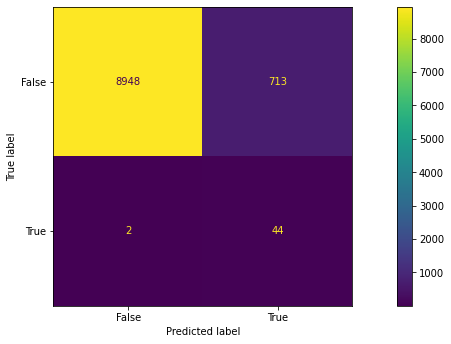

Epoch 1/1000
242/242 [==============================] - 16s 64ms/step - loss: 9270.4385 - val_loss: 2248.0527
Epoch 2/1000
242/242 [==============================] - 15s 64ms/step - loss: 2362.0212 - val_loss: 2122.8640
Epoch 3/1000
242/242 [==============================] - 15s 64ms/step - loss: 2165.2583 - val_loss: 2029.7698
Epoch 4/1000
242/242 [==============================] - 15s 64ms/step - loss: 2152.8865 - val_loss: 2027.4990
Epoch 5/1000
242/242 [==============================] - 15s 63ms/step - loss: 2152.2659 - val_loss: 2027.1744
Epoch 6/1000
242/242 [==============================] - 15s 63ms/step - loss: 2151.9517 - val_loss: 2026.7522
Epoch 7/1000
242/242 [==============================] - 17s 69ms/step - loss: 2152.0103 - val_loss: 2026.4065
Epoch 8/1000
242/242 [==============================] - 15s 63ms/step - loss: 2151.9226 - val_loss: 2026.4219
Epoch 9/1000
242/242 [==============================] - 15s 63ms/step - loss: 2152.0361 - val_loss: 2026.2716
Epoch 10/1

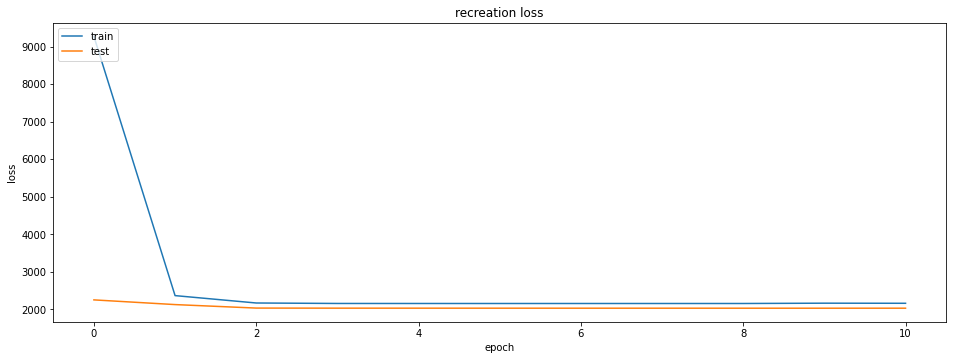

Intlier max value: 7809.574 Index Val: 9337
outlier max value: 8380.525 Index Val: 23
outlier min value: 5083.4727 Index Val: 43


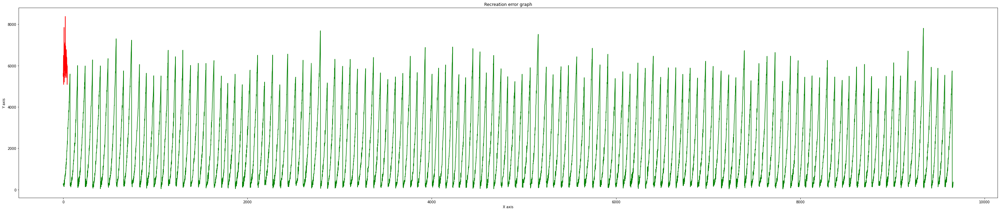

Total member in inlear: 9661
Total False alarm: 714
Total member in Outlier: 46
Total missed true alarm: 2
              precision    recall  f1-score   support

           0       1.00      0.93      0.96      9661
           1       0.06      0.96      0.11        46

    accuracy                           0.93      9707
   macro avg       0.53      0.94      0.54      9707
weighted avg       1.00      0.93      0.96      9707



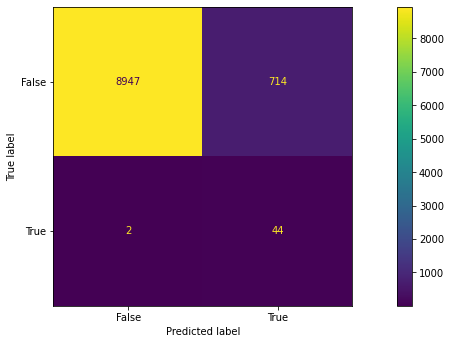

Epoch 1/1000
242/242 [==============================] - 16s 65ms/step - loss: 19800.3223 - val_loss: 13277.2207
Epoch 2/1000
242/242 [==============================] - 15s 64ms/step - loss: 11202.7461 - val_loss: 2264.5547
Epoch 3/1000
242/242 [==============================] - 17s 70ms/step - loss: 2390.3840 - val_loss: 2227.2173
Epoch 4/1000
242/242 [==============================] - 16s 64ms/step - loss: 2303.4753 - val_loss: 2093.4209
Epoch 5/1000
242/242 [==============================] - 15s 64ms/step - loss: 2174.6917 - val_loss: 2031.9696
Epoch 6/1000
242/242 [==============================] - 16s 64ms/step - loss: 2157.1316 - val_loss: 2032.0665
Epoch 7/1000
242/242 [==============================] - 16s 64ms/step - loss: 2155.9136 - val_loss: 2029.4764
Epoch 8/1000
242/242 [==============================] - 16s 64ms/step - loss: 2155.7385 - val_loss: 2029.6886
Epoch 9/1000
242/242 [==============================] - 15s 64ms/step - loss: 2154.4800 - val_loss: 2029.3612
Epoch 1

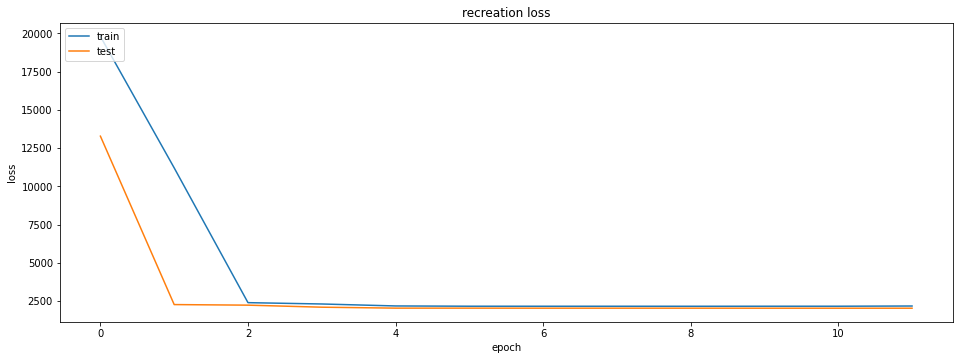

Intlier max value: 7808.1094 Index Val: 9337
outlier max value: 8384.664 Index Val: 23
outlier min value: 5084.364 Index Val: 43


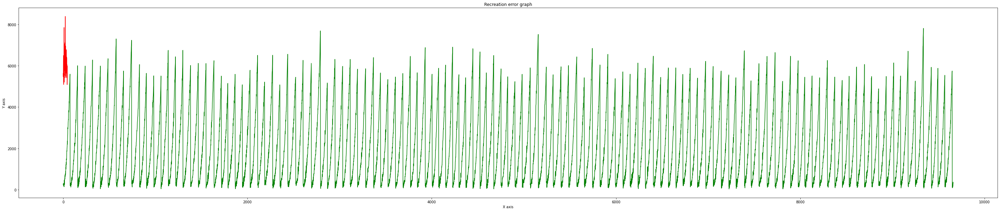

Total member in inlear: 9661
Total False alarm: 714
Total member in Outlier: 46
Total missed true alarm: 2
              precision    recall  f1-score   support

           0       1.00      0.93      0.96      9661
           1       0.06      0.96      0.11        46

    accuracy                           0.93      9707
   macro avg       0.53      0.94      0.54      9707
weighted avg       1.00      0.93      0.96      9707



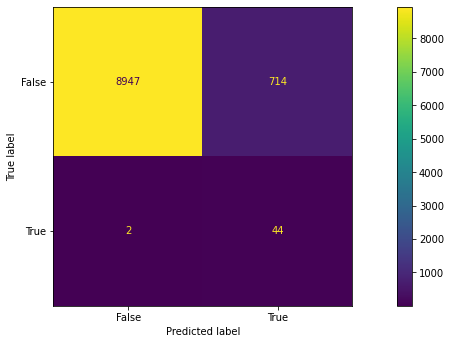

Epoch 1/1000
242/242 [==============================] - 17s 68ms/step - loss: 6413.9292 - val_loss: 418.6649
Epoch 2/1000
242/242 [==============================] - 16s 67ms/step - loss: 251.0715 - val_loss: 209.9197
Epoch 3/1000
242/242 [==============================] - 16s 68ms/step - loss: 208.3195 - val_loss: 209.8811
Epoch 4/1000
242/242 [==============================] - 16s 66ms/step - loss: 208.1677 - val_loss: 209.7436
Epoch 5/1000
242/242 [==============================] - 16s 67ms/step - loss: 207.9253 - val_loss: 209.1945
Epoch 6/1000
242/242 [==============================] - 18s 74ms/step - loss: 207.8764 - val_loss: 209.1139
Epoch 7/1000
242/242 [==============================] - 17s 69ms/step - loss: 207.7962 - val_loss: 209.0537
Epoch 8/1000
242/242 [==============================] - 16s 68ms/step - loss: 208.1937 - val_loss: 209.4520
Epoch 9/1000
242/242 [==============================] - 16s 68ms/step - loss: 208.0514 - val_loss: 213.1525
Epoch 10/1000
242/242 [====

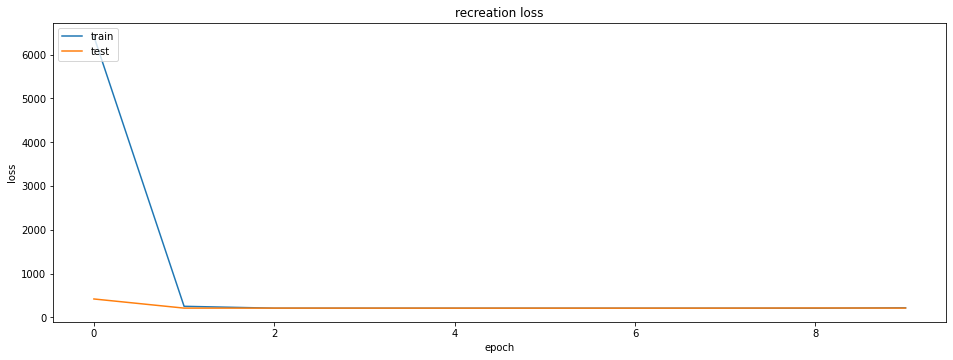

Intlier max value: 616.1341 Index Val: 6342
outlier max value: 533.9002 Index Val: 24
outlier min value: 37.566185 Index Val: 45


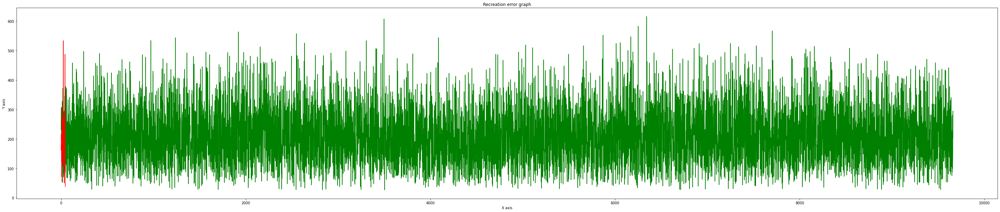

Total member in inlear: 9661
Total False alarm: 9611
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       0.98      0.01      0.01      9661
           1       0.00      0.98      0.01        46

    accuracy                           0.01      9707
   macro avg       0.49      0.49      0.01      9707
weighted avg       0.98      0.01      0.01      9707



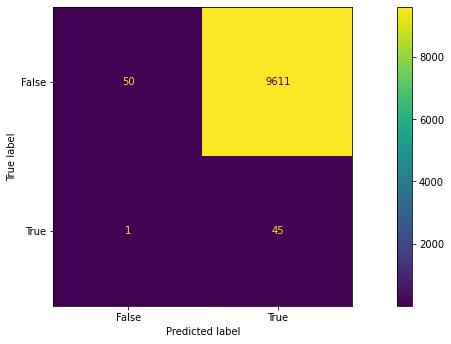

Epoch 1/1000
242/242 [==============================] - 18s 74ms/step - loss: 10791.1338 - val_loss: 2273.6560
Epoch 2/1000
242/242 [==============================] - 16s 67ms/step - loss: 2400.1399 - val_loss: 2238.2786
Epoch 3/1000
242/242 [==============================] - 17s 71ms/step - loss: 2295.9167 - val_loss: 2052.6050
Epoch 4/1000
242/242 [==============================] - 16s 67ms/step - loss: 2159.2864 - val_loss: 2028.1412
Epoch 5/1000
242/242 [==============================] - 16s 67ms/step - loss: 2152.8506 - val_loss: 2027.3517
Epoch 6/1000
242/242 [==============================] - 17s 72ms/step - loss: 2152.7344 - val_loss: 2026.7861
Epoch 7/1000
242/242 [==============================] - 16s 67ms/step - loss: 2155.0945 - val_loss: 2032.5309
Epoch 8/1000
242/242 [==============================] - 16s 68ms/step - loss: 2155.1069 - val_loss: 2027.5776
Epoch 9/1000
242/242 [==============================] - 17s 72ms/step - loss: 2164.9153 - val_loss: 2026.6537
Loss 2164

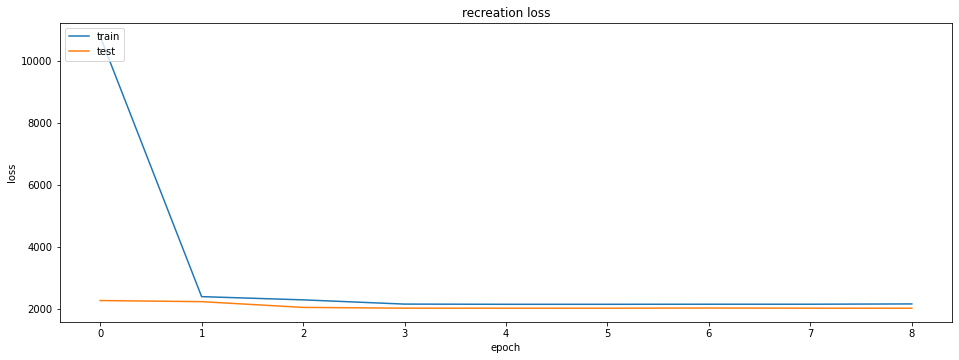

Intlier max value: 7808.074 Index Val: 9337
outlier max value: 8378.231 Index Val: 23
outlier min value: 5082.829 Index Val: 43


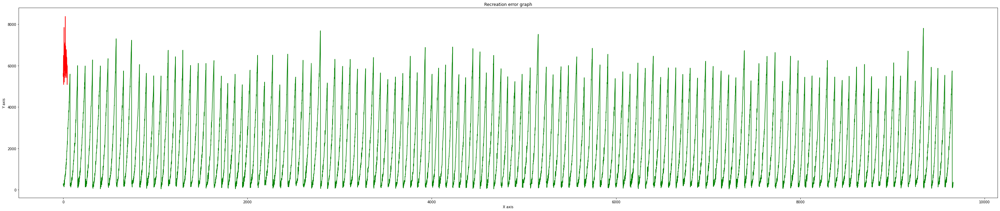

Total member in inlear: 9661
Total False alarm: 713
Total member in Outlier: 46
Total missed true alarm: 2
              precision    recall  f1-score   support

           0       1.00      0.93      0.96      9661
           1       0.06      0.96      0.11        46

    accuracy                           0.93      9707
   macro avg       0.53      0.94      0.54      9707
weighted avg       1.00      0.93      0.96      9707



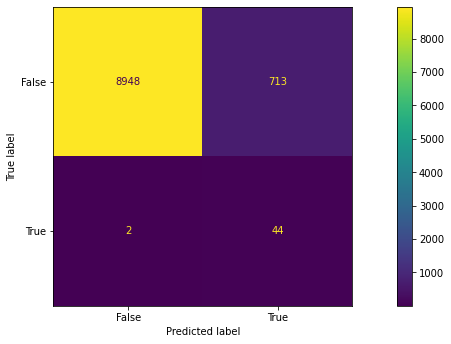

Epoch 1/1000
242/242 [==============================] - 17s 68ms/step - loss: 8097.2637 - val_loss: 2258.5881
Epoch 2/1000
242/242 [==============================] - 16s 67ms/step - loss: 2397.7317 - val_loss: 2218.1589
Epoch 3/1000
242/242 [==============================] - 17s 72ms/step - loss: 2247.1296 - val_loss: 2035.2925
Epoch 4/1000
242/242 [==============================] - 17s 72ms/step - loss: 2158.0864 - val_loss: 2032.0026
Epoch 5/1000
242/242 [==============================] - 16s 66ms/step - loss: 2155.5923 - val_loss: 2033.0302
Epoch 6/1000
242/242 [==============================] - 16s 67ms/step - loss: 2155.1091 - val_loss: 2028.4094
Epoch 7/1000
242/242 [==============================] - 16s 66ms/step - loss: 2153.9050 - val_loss: 2029.6522
Epoch 8/1000
242/242 [==============================] - 16s 67ms/step - loss: 2153.2478 - val_loss: 2027.9111
Epoch 9/1000
242/242 [==============================] - 16s 68ms/step - loss: 2154.2288 - val_loss: 2029.1407
Epoch 10/1

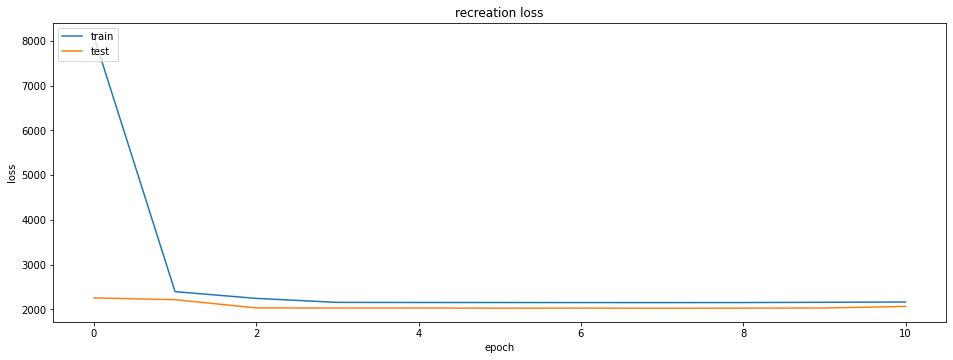

Intlier max value: 7852.997 Index Val: 9337
outlier max value: 8420.78 Index Val: 23
outlier min value: 5133.2925 Index Val: 5


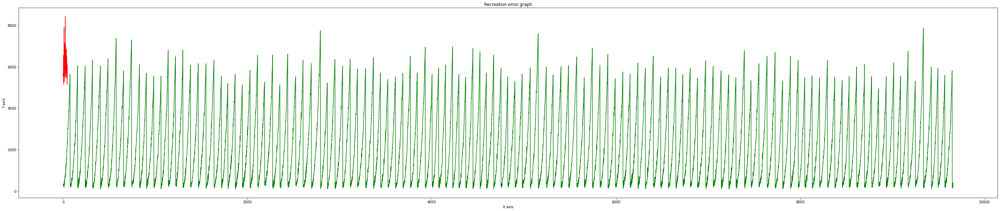

Total member in inlear: 9661
Total False alarm: 712
Total member in Outlier: 46
Total missed true alarm: 2
              precision    recall  f1-score   support

           0       1.00      0.93      0.96      9661
           1       0.06      0.96      0.11        46

    accuracy                           0.93      9707
   macro avg       0.53      0.94      0.54      9707
weighted avg       1.00      0.93      0.96      9707



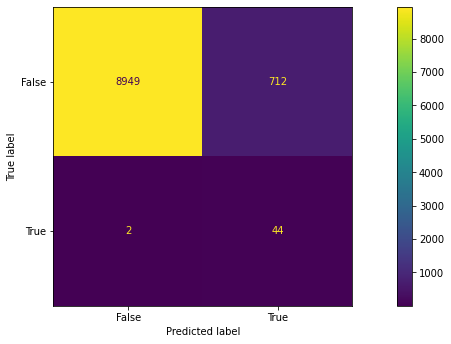

Epoch 1/1000
242/242 [==============================] - 18s 70ms/step - loss: 6107.4663 - val_loss: 402.6308
Epoch 2/1000
242/242 [==============================] - 16s 67ms/step - loss: 304.1014 - val_loss: 225.4275
Epoch 3/1000
184/242 [=====================>........] - ETA: 3s - loss: 218.6038

KeyboardInterrupt: ignored

In [ ]:
import tensorflow as tf
from tensorflow import keras
from keras import layers
from tensorflow.keras import regularizers
import numpy as np
e = 1000
# Load the training and test data
train_inlear_all, test_outlier_all,rd = rawDataload_TWF()
train_inlear = train_inlear_all
test_outlier = test_outlier_all
# amplify the diffrences 
trn = np.power(train_inlear.values, 1)
tst = np.power(test_outlier.values, 1)

# nomalize by dividing max value of train matrix
max_value = np.max(trn,axis =0)
print(max_value)
trainN = (trn/max_value)*max_value
testN = (tst/max_value)*max_value

# Generate and train the model
train_2 = trainN.reshape(len(trainN),1,8,1)
# Input for  looping:
trecall_max = 0.0
frecall_max = 0.0
count = 0
from google.colab import drive
drive.mount('/content/gdrive')
m1_path = '/content/gdrive/MyDrive/outlier_models/m2_undercomplete'
while count < 5:
  m1,history = m2_2dcnnae_single_conv(train_2,e)
  #m2_2dcnnae_single_conv(train,e)
  MODEL1 = m1
  X_test_2 = testN.reshape(len(testN),1,8,1)
  # Output analysis
  ## Plot the model training and validation 
  print("Loss",list(history.history['loss'])[-1],"Validation Loss:",list(history.history['val_loss'])[-1])
  plt_model_accuracy(history)
  inlier_lst,outlier_lst = model_analysis(train_2,X_test_2,MODEL1)
  #outlier cut-off point:
  oc = min(outlier_lst)
  oc = oc+oc*(1/100)
  mat1 = confusionMatrix(oc,inlier_lst,outlier_lst)
  trecall = mat1['0']['recall']
  frecall = mat1['1']['recall']
  if trecall_max <= trecall and frecall_max <= frecall:
    trecall_max = trecall
    frecall_max = frecall
    count+=1
    print("trecall_max:",trecall_max,'frecall_max:',frecall_max, 'Count:',count)
    MODEL1.save(m1_path)
    if count == 5:
      break

In [ ]:
m1.summary()

Model: "model_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Conv_deconv_singleLayer (In  [(None, 1, 8, 1)]        0         
 putLayer)                                                       
                                                                 
 conv2d_42 (Conv2D)          (None, 1, 6, 32)          128       
                                                                 
 conv2d_43 (Conv2D)          (None, 1, 4, 128)         12416     
                                                                 
 conv2d_44 (Conv2D)          (None, 1, 2, 512)         197120    
                                                                 
 conv2d_transpose_42 (Conv2D  (None, 1, 4, 128)        196736    
 Transpose)                                                      
                                                                 
 conv2d_transpose_43 (Conv2D  (None, 1, 6, 32)         123

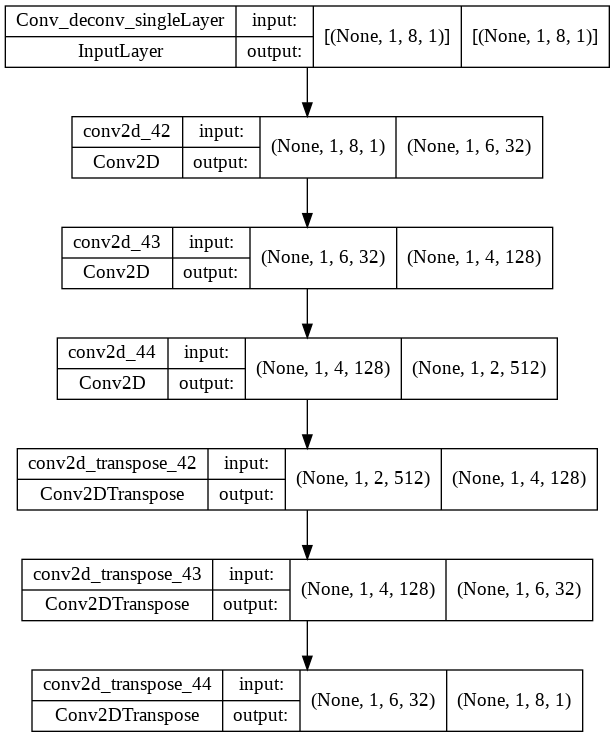

In [ ]:
tf.keras.utils.plot_model(m1, "LSTM_AE_1.png", show_shapes=True)

# Save the model on google drive


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')
m1_path = '/content/gdrive/MyDrive/outlier_models/m2'
m1.save(m1_path)

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m2/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m2/assets


In [ ]:
!ls /content/gdrive/MyDrive/outlier_models
m1.save(path)

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/assets


In [ ]:
y_pred[9700:9707]

[0, 0, 0, 0, 1, 1, 1]

In [ ]:
train_inlear.head(10)

,airTemp,processTemp,rotationalSpeed,torque,toolwear,Type_is_H,Type_is_L,Type_is_M
0,298.1,308.6,1551,42.8,0,0,0,1
1,298.2,308.7,1408,46.3,3,0,1,0
2,298.1,308.5,1498,49.4,5,0,1,0
3,298.2,308.6,1433,39.5,7,0,1,0
4,298.2,308.7,1408,40.0,9,0,1,0
5,298.1,308.6,1425,41.9,11,0,0,1
6,298.1,308.6,1558,42.4,14,0,1,0
7,298.1,308.6,1527,40.2,16,0,1,0
8,298.3,308.7,1667,28.6,18,0,0,1
9,298.5,309.0,1741,28.0,21,0,0,1


In [ ]:
test_outlier.head(2)

,airTemp,processTemp,rotationalSpeed,torque,toolwear,Type_is_H,Type_is_L,Type_is_M
77,298.8,308.9,1455,41.3,208,0,1,0
1087,296.9,307.8,1549,35.8,206,1,0,0


# Load the saved model

In [ ]:
import tensorflow as tf
from google.colab import drive
drive.mount('/content/gdrive')
m1_path = '/content/gdrive/MyDrive/outlier_models/m1' 
m2 = tf.keras.models.load_model(m1_path)

Mounted at /content/gdrive


In [ ]:
m2.summary()

Model: "model_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Conv_deconv_singleLayer (In  [(None, 1, 8, 1)]        0         
 putLayer)                                                       
                                                                 
 conv2d_18 (Conv2D)          (None, 1, 6, 32)          128       
                                                                 
 conv2d_19 (Conv2D)          (None, 1, 4, 128)         12416     
                                                                 
 conv2d_20 (Conv2D)          (None, 1, 2, 512)         197120    
                                                                 
 conv2d_transpose_18 (Conv2D  (None, 1, 4, 128)        196736    
 Transpose)                                                      
                                                                 
 conv2d_transpose_19 (Conv2D  (None, 1, 6, 32)         123